In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Spis tereści  
2. [Eksploatacyjna analiza danych](#2)  
    2.1 [Wczytanie danych](#21)  
    2.2 [Ogólna analiza zbioru](#22)  
    2.3 [Analiza zmiennych numerycznych](#23)  
    2.3.1 [Analiza rozkładu zmiennych w zależności od targetu](#231)   
    2.3.1.1 [Analiza zmiennych 'mths_since_last_delinq' i 'mths_since_last_record'](#2311)  
    2.3.2.2 [Analiza zmiennych 'annual_inc_log' i 'revol_bal' transformacja logarytmiczna](#2321)  
    2.3.2 [Analiza statystyczna zmiennych numerycznych](#232)  
    2.4 [Analiza zmiennych kategorycznych](#24)  
    2.4.1 [Zmienna 'zip_code'](#241)  
    2.4.2 [Analiza statystyczna](#242)  
    2.5 [Analiza zmiennych czasowych](#25)  
    2.6 [Podsumowanie - pytania projektowe](26)  
    2.7 [Analiza wartości odstających](#27)  
    2.7.1 [Zastąpienie wartości odstających](#271)  
    2.8 [Transformacja Boxa-Coxa](#28)  
    2.9 [Binaryzacja danych](#29)  
    2.10 [Zmienna kategoryczna 'mths_since_last_delinq_cat'](#210)  
    2.11 [Podsumowanie](#211)  
3. [Inżynieria danych - nowe zmienne](#31)  
    3.1 [Zmienna "funded_to loan_amnt"](#31)  
    3.2 [Zmienna "age_of_credit_line"](#32)  
    3.3 [Zmienna "funded_income_ratio" ](#33)  
    3.4 [Zmienna "funded_inv_to_tot_ratio"](#34)  
    3.5 [Zmienna "mth_inncom" dochód miesięczny](#35)  
    3.6 [Zmienna "mth_install_to_incom"](#36)  
    3.7 [Zmienna "acc_hist" ](#37)  
    3.8 [Zmienna "pub_rec_type" ](#38)  
    3.9 [Zmienna "other_debt" ](#39)  
    3.10 [Zmienna 'mnt_debt_installment' ](#310)  
    3.11 [Zmienna "fico_int_rate"](#311)  
    3.12 [Zmienna 'funded_amnt_fico'](#312)  
    3.13 [Zmienna "dti_ratio_per_grade"](#313)  
    3.14 [Zmienna "dti_ratio_per_purpose"](#314)  
    3.15 [Zmienna "mean_funded_addr](#315)  
    3.16 [Zmienna "mean_ann_inc_adrr"](#316)  
    3.17 [Zmienna "mean_fico_adrr" ](#317)  
    3.18 [ Zmienna "desc_len" długość opisu kredytu](#318)  
    3.19 [Zmienna 'consolidation'](#319)  
    3.20 [Zapisanie dnych](#320)  



###Import bibliotek

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import spearmanr
from scipy.stats import shapiro
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import chi2_contingency
from scipy.stats import spearmanr


In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#### <a name = '2'></a> 2. Eksploatacyjna analiza danych

#### <a name = '21'></a> 2.1 Wczytanie danych

In [5]:
data = pd.read_csv('/content/drive/My Drive/Future_Collars/Loan_data_obrobka_danych.csv')

In [6]:
data.head(3)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,emp_length_num,grade_num,fico_value,fico_category,term_numeric
0,5000.0,5000.0,4975.0,36 months,10.6,162.87,B,1.2,10+ years,RENT,24000.0,Verified,2011-12-01,1,Borrower added on 12/22/11 > I need to upgra...,credit_card,Borrower added on 12/22/11 > I need to upgra...,860xx,AZ,27.65,0.0,1985-01-01,1.0,300.0,300.0,3.0,0.0,13648.0,83.7,9.0,0.0,10,1,737.0,Good,36
1,2500.0,2500.0,2500.0,60 months,15.3,59.83,C,2.4,< 1 year,RENT,30000.0,Source Verified,2011-12-01,0,Borrower added on 12/22/11 > I plan to use t...,car,Borrower added on 12/22/11 > I plan to use t...,309xx,GA,1.00,0.0,1999-04-01,5.0,300.0,300.0,3.0,0.0,1687.0,9.4,4.0,0.0,0,2,742.0,Very_good,60
2,2400.0,2400.0,2400.0,36 months,16.0,84.33,C,2.5,10+ years,RENT,12252.0,Not Verified,2011-12-01,1,0,small_business,0,606xx,IL,8.72,0.0,2001-11-01,2.0,300.0,300.0,2.0,0.0,2956.0,98.5,10.0,0.0,10,2,737.0,Good,36


#### <a name = '22'></a> 2.2 Ogólna analiza zbioru

In [7]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'desc',
       'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'emp_length_num',
       'grade_num', 'fico_value', 'fico_category', 'term_numeric'],
      dtype='object')

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42531 entries, 0 to 42530
Data columns (total 36 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   loan_amnt               42531 non-null  float64
 1   funded_amnt             42531 non-null  float64
 2   funded_amnt_inv         42531 non-null  float64
 3   term                    42531 non-null  object 
 4   int_rate                42531 non-null  float64
 5   installment             42531 non-null  float64
 6   grade                   42531 non-null  object 
 7   sub_grade               42531 non-null  float64
 8   emp_length              42531 non-null  object 
 9   home_ownership          42531 non-null  object 
 10  annual_inc              42531 non-null  float64
 11  verification_status     42531 non-null  object 
 12  issue_d                 42531 non-null  object 
 13  loan_status             42531 non-null  int64  
 14  desc                    42531 non-null

#### <a name = '23'></a> 2.3 Analiza zmiennych numerycznych

In [9]:
# Lista kolumn zmiennych numerycznych
columns_num = data.select_dtypes(include=['number']).columns.tolist()

In [10]:
columns_num

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'sub_grade',
 'annual_inc',
 'loan_status',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'emp_length_num',
 'grade_num',
 'fico_value',
 'term_numeric']

In [11]:
data_num = data[columns_num]

In [12]:
len(columns_num)

23

In [13]:
data_num.shape

(42531, 23)

In [14]:
data_num.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amnt,42531.0,11090.173050,7411.137529,500.00,5200.00,9700.00,15000.000,35000.00
funded_amnt,42531.0,10822.011004,7147.112309,500.00,5000.00,9600.00,15000.000,35000.00
funded_amnt_inv,42531.0,10140.582662,7131.587121,0.00,4950.00,8500.00,14000.000,35000.00
int_rate,42531.0,12.165620,3.709121,5.40,9.60,12.00,14.700,24.60
installment,42531.0,322.634879,208.933353,15.67,165.52,277.71,428.275,1305.19
sub_grade,42531.0,1.976097,1.419525,0.10,1.10,1.50,3.100,6.50
annual_inc,42531.0,69136.556420,64096.349719,1896.00,40000.00,59000.00,82500.000,6000000.00
loan_status,42531.0,0.848793,0.358255,0.00,1.00,1.00,1.000,1.00
dti,42531.0,13.374136,6.725675,0.00,8.20,13.47,18.680,29.99
delinq_2yrs,42531.0,0.152359,0.512269,0.00,0.00,0.00,0.000,13.00


In [15]:
# korelacja względem targetu
corr_matrix = data_num.corr()
corr_matrix['loan_status'].sort_values(ascending = False)

,loan_status
loan_status,1.000000
fico_value,0.141869
mths_since_last_record,0.074554
annual_inc,0.037994
mths_since_last_delinq,0.036515
total_acc,0.021100
open_acc,0.005967
funded_amnt_inv,-0.009858
revol_bal,-0.017161
delinq_2yrs,-0.019497


*Dane numeryczne są słabo skorelowane z targetem*

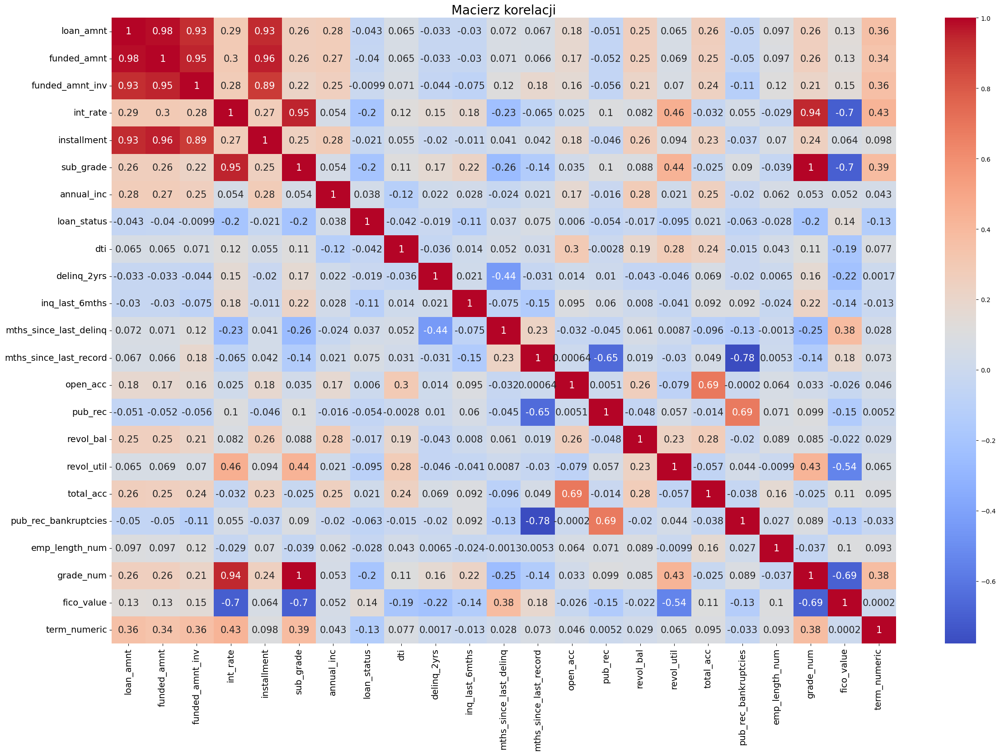

In [16]:
# heatmapa
plt.figure(figsize=(28, 18))
ax = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',annot_kws={"size": 15})
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)
plt.title('Macierz korelacji', fontsize=20)
plt.show()

*Można zaobserwować korelacje pomiedzy zmiennymi które niosą podobne informacje o kliencie. I tak istnieje:  
1) Bardzo silna dodatnia korelacja pomiędzy zmiennymi zwiazanymi z kwotą kredytu:  
'loan_amnt', 'funded_amnt', 'funded_amnt_inv' i installment > 0.9  
grade i subgrade - 1  
grade, subgrade a int_rate > 0.9  
Należy rozważyć redukcje wymiarowości w przypadku tych zmiennych aby uniknać współliniowości.  
2) Silna ujemna korelacja pomiędzy zmiennymi zwiazanymi z ocena wiarygodności kredytowej klienta:  
fico_value a int_rate -0.7  
fico_value a grade/sub_grade  -0.7  
3) Silna  korelacja pomiedzy zmiennymi związanymi z wpisem w rejestrach publicznych  
pub_rec_bankruptcies a mnth_since_last_record -0.78  
pub_rec_bankruptcies a pub_rec 0.69  
liczba bankructw/liczba wpisów/liczba miesięcy od ostatniego wpisu.  
4) Silna korelacja pomiędzy zmiennymi związanymi z iloscia kąt
open_acc i total_acc 0.69  
5) mths_since_last_delinq a delinq_2yrs -0.44  
Ilość miesięcy od ostatniej przeterminowanej płatnosci a liczba przypadków przeterminowanych płatności pożyczkobiorcy w ciągu ostatnich 2 lat.  
6) wskaźnik fico i revol_util -0.54 Stopień wykorzystania linii kredytowych rewolwingowych*  


In [17]:
# na potrzeby wizualizacji zrobiony zbiór bez wartości 300 dla 'mths_since_last_delinq'
data_num_anal = data_num[data_num['mths_since_last_delinq']!=300]


<Axes: xlabel='fico_value', ylabel='mths_since_last_delinq'>

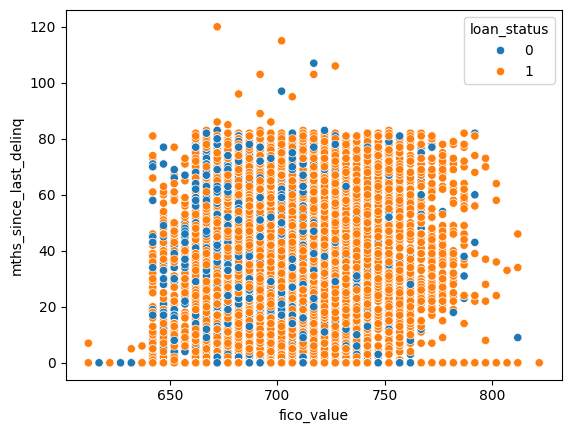

In [18]:
sns.scatterplot(data=data_num_anal, x='fico_value', y='mths_since_last_delinq', hue= 'loan_status')

*Wraz ze wzrostem wartości fico wzrasta ilość spłaconych kredytów, przy czym wartość mths_since_last_delinq nie wydaje się mieć na to wpływu*

<Axes: xlabel='int_rate', ylabel='mths_since_last_delinq'>

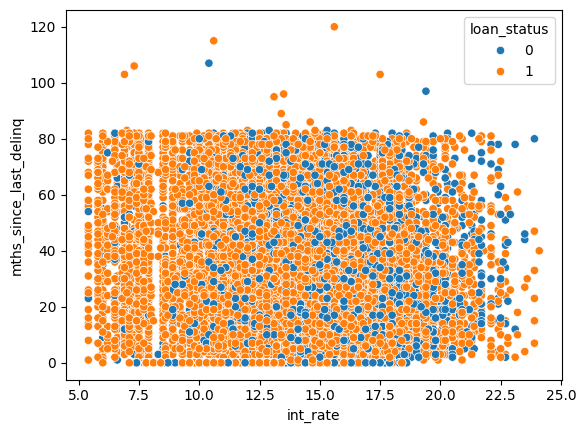

In [19]:
sns.scatterplot(data=data_num_anal, x='int_rate', y='mths_since_last_delinq', hue= 'loan_status')

*Podobnie jak powyżej ze wzrostem oprocentowania wzrasta ilość niespłaconych kredytów, niezależnie od wartości mths_since_last_delinq*

<Axes: xlabel='dti', ylabel='mths_since_last_delinq'>

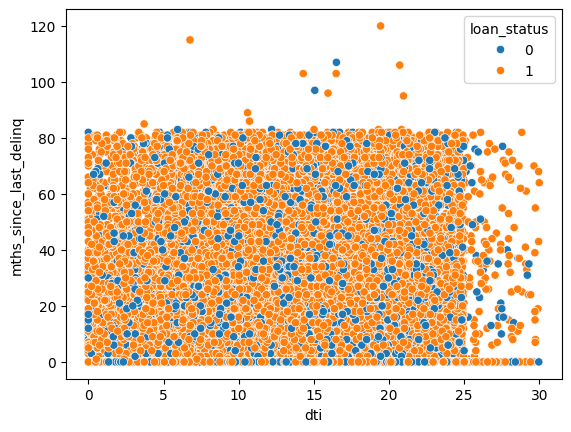

In [20]:
sns.scatterplot(data=data_num_anal, x='dti', y='mths_since_last_delinq', hue= 'loan_status')

*Nie widać korelacji pomiędzy zmiennymi 'dti', i 'mths_since_last_delinq' a spłacalnością kredytu.*

<Axes: xlabel='fico_value', ylabel='dti'>

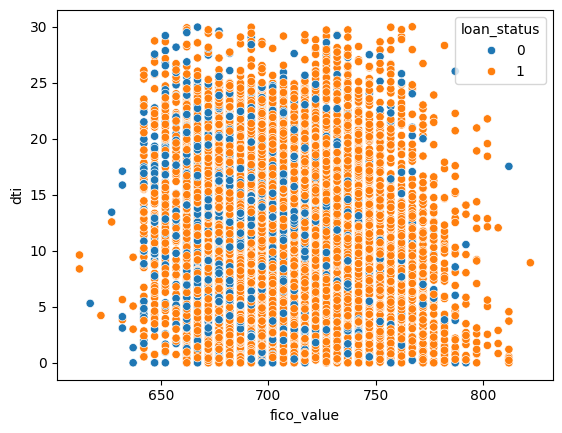

In [21]:
sns.scatterplot(data=data_num_anal, x='fico_value', y='dti', hue= 'loan_status')

*Ze wzrostem FICO rośnie ilość spłaconych kredytów niezaleznie od wartości dti*

<Axes: xlabel='fico_value', ylabel='int_rate'>

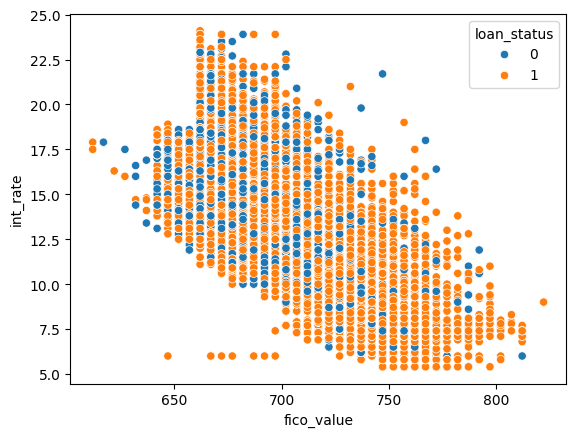

In [22]:
sns.scatterplot(data=data_num_anal, x='fico_value', y='int_rate', hue= 'loan_status')

*Widać wyraźną korelację między zmiennymi. Ze wzrostem FICO i ze spadkiem oprocentowania rośnie ilość spłaconych kredytów*

<Axes: xlabel='fico_value', ylabel='grade_num'>

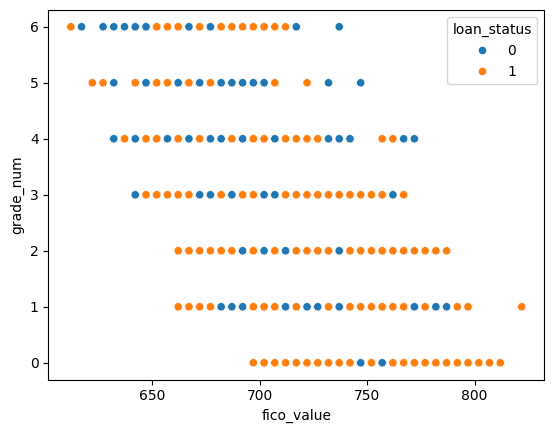

In [23]:
sns.scatterplot(data=data_num_anal, x='fico_value', y='grade_num', hue= 'loan_status')

*Ze wzrostem grade wzrasta niespłacalność kredytu a zakres FICO przesuwa się w kierunku mniejszych wartości.*

In [24]:
lista= ['dti', 'fico_value', 'grade_num', 'mths_since_last_delinq','int_rate' ]

#### <a name = '231'></a> 2.3.1. Analiza rozkładu zmiennych w zależności od targetu

In [25]:
data_num_col = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate',  'installment', 'grade_num','sub_grade',  'emp_length_num' , 'dti',
       'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'fico_value', 'term_numeric']

In [26]:
def ratio_0_1(col, data):
    data_grouped = data[[col, 'loan_status']]
    data_grouped = data_grouped.groupby([col, 'loan_status']).size()
    df = data_grouped.reset_index()
    df.columns = [col, 'loan_status', 'count']
    pivot_df = df.pivot(index=col, columns='loan_status', values='count')
    pivot_df['ratio'] = pivot_df[0] / pivot_df[1]
    return pivot_df.reset_index()

In [27]:
def ratio_0_1_num(col, data, bins):
    data1 = data.copy()
    data1.loc[:, 'bins'] = pd.cut(data1[col], bins=bins)

    data_grouped = data1[['bins', 'loan_status']].copy()
    data_grouped = data_grouped.groupby(['bins', 'loan_status'], observed=False).size().reset_index()
    data_grouped.columns = ['bins', 'loan_status', 'count']

    pivot_df = data_grouped.pivot(index='bins', columns='loan_status', values='count').fillna(0)
    pivot_df['ratio'] = pivot_df[0] / pivot_df[1]
    pivot_df = pivot_df.reset_index()
    pivot_df['bin_center'] = pivot_df['bins'].apply(lambda x: round(x.mid, 1))
    return pivot_df


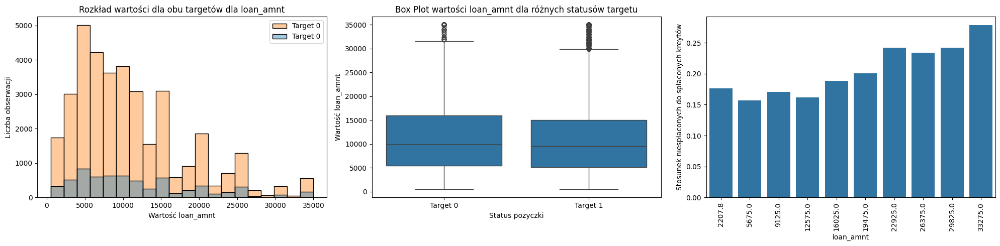

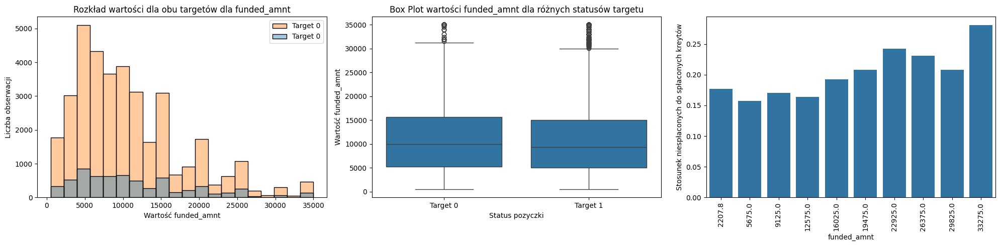

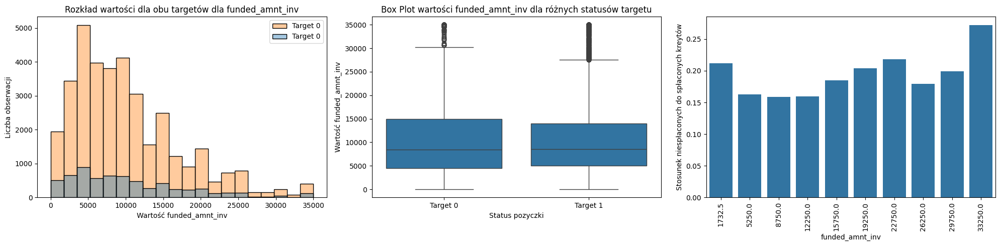

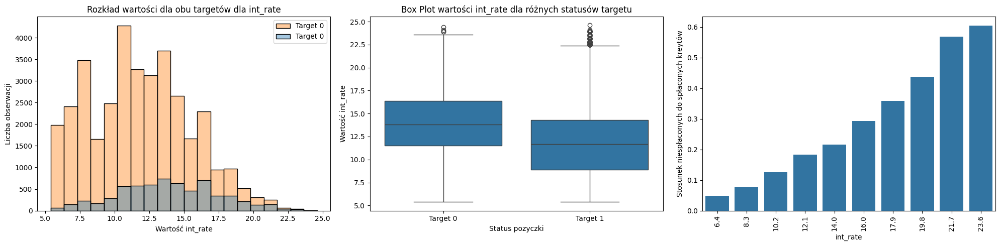

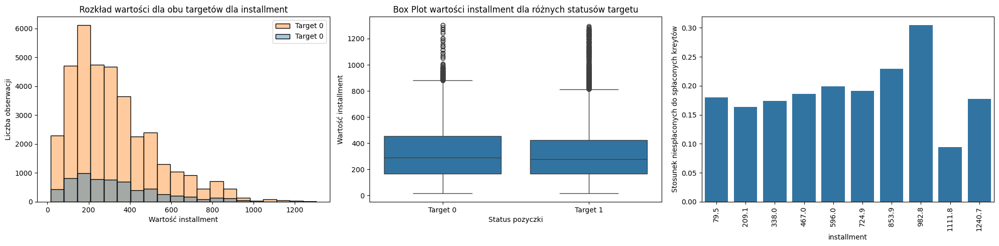

...

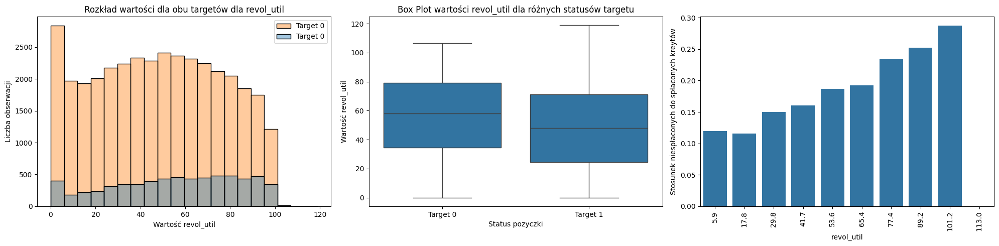

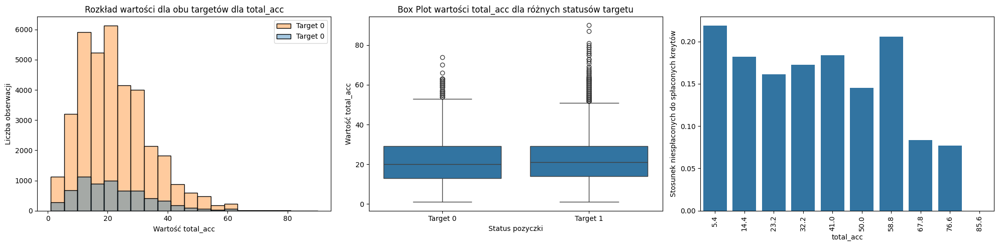

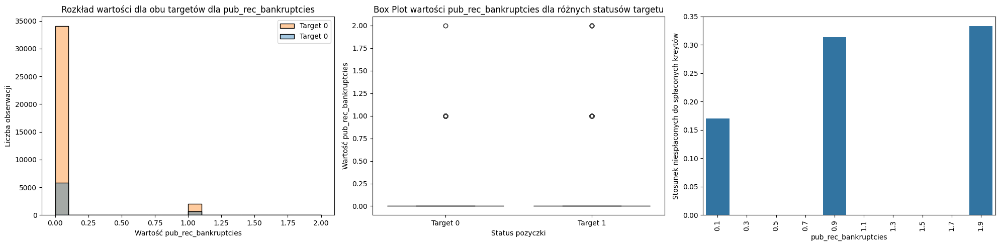

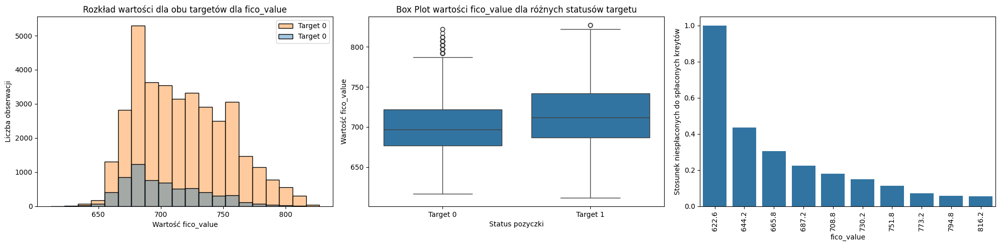

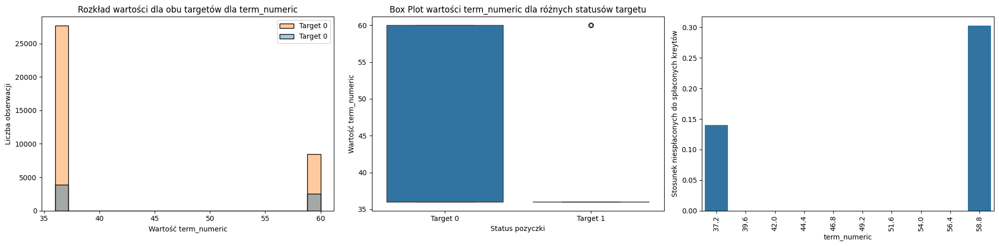

In [28]:
for col in data_num_col:
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))
    sns.histplot(data=data_num, x=col, hue='loan_status', bins=20, kde=False, color='blue', alpha=0.4, ax=axs[0], label='Target 0')
    axs[0].set_title('Rozkład wartości dla obu targetów dla ' + col)
    axs[0].set_xlabel('Wartość ' + col)
    axs[0].set_ylabel('Liczba obserwacji')
    axs[0].legend()

    sns.boxplot(x='loan_status', y=col, data=data_num, ax=axs[1])
    axs[1].set_title('Box Plot wartości ' + col + ' dla różnych statusów targetu')
    axs[1].set_xlabel('Status pozyczki')
    axs[1].set_ylabel('Wartość ' + col)
    axs[1].set_xticks([0, 1])
    axs[1].set_xticklabels(['Target 0', 'Target 1'])

    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col, data_num, 10),  ax=axs[2])
    axs[2].set_xlabel(col)
    axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
    axs[2].tick_params(axis='x', rotation=90)
    plt.tight_layout()
    plt.show()

In [29]:
data[data['term_numeric'] == 60].sort_values(by = 'issue_d', ascending = True).head(1)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,emp_length_num,grade_num,fico_value,fico_category,term_numeric
40447,12000.0,12000.0,11950.0,60 months,14.6,282.91,D,3.1,10+ years,MORTGAGE,50585.0,Source Verified,2010-05-01,1,Borrower added on 05/16/10 > I would like to...,debt_consolidation,Borrower added on 05/16/10 > I would like to...,486xx,MI,22.49,0.0,1991-08-01,1.0,300.0,300.0,15.0,0.0,54073.0,52.1,28.0,0.0,10,3,697.0,Good,60


In [30]:
# Analiza stosunku spłaconych do niespłaconych kredytów dla zmiennej term w czasie gdy oba rodzaje kredytów były przyznawane.
data_both = data[data['issue_d'] > '2010-05-01']


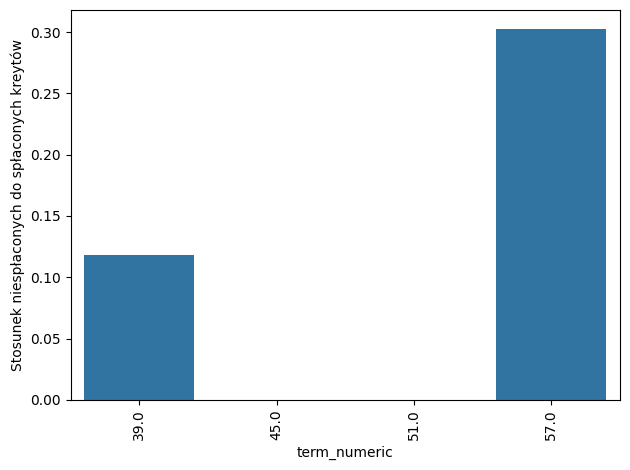

In [31]:
sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num('term_numeric', data_both, 4))
plt.xlabel('term_numeric')
plt.ylabel('Stosunek niespłaconych do spłaconych kreytów')
plt.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

*Analiza histogramów, wykresów pudełkowych i boxplotów.  
W przypadku zmiennych związanych z wysokościa kredytu czy raty kredytowej ('loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment') nie zaobserwowano zasadniczych różnic w rozkładzie zmiennych związanych z faktem czy kredyt został spłacony czy nie. W przypadku kredytów niespłaconych maksymalne wartości były nieznacznie większe. Dla zmiennej zwiazanej z kwota wnioskownego kredytu zobserwować można wzrost stosunku niespłaconych do spłaconych kredytów z kwotą. Jednak dotyczy to bardzo małę częsci zbioru.Zarówno w przypadku zmiennych związanych z targetem 0 jak i 1 występują wartości odstające.
Dla zmiennej "int_rate" - mediana oprocentowania kredytu była nieco wyższa dla kredytów które nie zostały spłacone, pozostałe wartości takie jak rozstęp interkwartylowy, czy zakres wartości nie odbiegały znacząco od siebie. Wyraźnie natomiast widac że ze wzrostem oprocentowania warasta stosunkej niespłaconych do spłaconych kredytów.
Dla zmiennych grade i sub_grade widoczna jest różnica w rozkładzie wartości w zależności od wartości targetu. Dla kredytów niespłaconych zarówno zakres ratingu jak i mediana posiadała wartości wyższe niż dla kredytów spłaconych. W przypadku kredytów spłaconych wartosci maksymalne były takie same jak dla niespłaconych jednak ze wzgledu mna mniejszą ilość statystycznie stanowią wartosci odstajace. Widać ze wzrostem grade wyraźny wzrost stosunku niespłaconych do spłaconych kredytów.
Rozkłd zmiennej czas zatrudnienia (emp_lenght_num) były zblizone jeśli chodzi o rozstep interwartylowy i medianę. Jednak dla kredytów niespłaconych zakres obejmował równiez osoby które nie podły czasu zatrudnienia, a w przypadku kredytów spłaconych osoby te sa potraktowane jako wartości odstające, co wskazuje na różny rozkład targetu dla osób które nie podały tej informacji. Widać również wyraźna różnicę pomiedzy stosunkiem niespłaconych do spłaconych kredytów w stosunku do osób które podały i nie podąły informacji o zatrudnieniu. W grupie osób które nie podały informacji o zatrudnieniu wspomniany stosunek był około 2 razy wyższy niz w grupie która podała ta informację.  
Rozkład zmiennej dti (stosunek wydatków do dochodów) był prawie taki sam niezaleznie od wartości targetu. Nie widać wyraźniej zależności pomiędzy dti a stosunkiem niespłaconych do spłaconych kredytów.  
Liczba przeterminowanych przypadków płatności w ciagu dwóch lat  - delinq_2yrs oraz ilośc zapytan kredytowych w przeciągu ostatniego pól roku - inq_last_6mths nie wykazywały zróżnicowania w rozkładzie danych w stodsunku do targetu  0 i 1 oraz stosunku  oraz niespłaconych do spłaconych kredytów. Dla obuu zmiennych widoczne są pojedynce wysokie wartosci odbiegające od pozostałych ale jest to wynikiem małej ilosci wartości w tym przedziale.  
W przypadku zmiennych open_acc i total_acc, pub_rec, pub_rec_bankruptcies,   rozkład był prawie taki sam niezaleznie od wartości targetu. Natmiast stosunek niespłaconych do spłaconych kredytów dla zmiennych pub_rec i pub_rec_bankruptcies dla wartości 0 był nizszy niż dla wartości 1 czy 2, coświadczy o tym że wśrod osób które nie znalazły się w rejestrach występowała wyższa spłacalność kredytów.  
Zmienna revol_util związana z wykorzystaniem dostepnej lini kredytowej wykazywała inny rozkład wartości dla kredytów spłaconych i niespłaconych. W przypadku kredytów niespłaconych media była wyższa, natomiast zakres był mniejszy niż dla kredytów spaconych. O ile wyższa wartosc mediamy wydaje sie byc logiczna, to wyższy górny zakres kredytów spłaconych juz nie. Stosunek niespłaconych do spłąconytch kredytów wykazywał delikatna tendencje wzrostową ze wzrostem wartosci tej zmiennej. Na końcu wykredu wystepuje pewna anomalia która jest zwiazana z małą iloscia wartosci w tym zakresie.  
Dla zmiennej fico_value zakres wartości oraz mediana dla targetu 1 był wyższy niż dla targetu 0, co jest zgodne z oczekiwaniami. Również stosunek nispłaconych do spłaconych kredytów wyrażnie malał ze wzrostem tej wartości.  
Zmienna długość kredytu ma istotny wpływ na spłacalność kredytu.  Co widać na ostatnim wykresie. Dane zostały sprawdzona dla zakresu dat kiey zarówno kredyty 60 mies. jak i 36 mies. były przyznawane równocześnie.  
Dla wszystkich zmiennych histogramy nie wykazują rozkładu normalnego. Zostanie to jeszcze potwierdzone testem statystycznym.*


#### <a name = '2311'></a> 2.3.1.1 Analiza zmiennych 'mths_since_last_delinq' i 'mths_since_last_record'

*mths_since_last_delinq - Liczba miesięcy od ostatniej przeterminowanej płatności.  
mths_since_last_record - Liczba miesięcy od ostatniego wpisu w rejestrze publicznym (np. upadłość).  
Zmienne posiadały dużo wartosci brakujących które mogą oznaczać odpowiednio brak zaległości w płatności kredytu oraz brak odnotowania bankructwa w rejestrach publicznych. Braki te dla potrzeb oznaczenia korelacji zastapione zostały wartościa 300, jednak na potrzeby analizy statystycznej zbioru zostaną pominięte.*

In [32]:
data_msld_new = data_num[data_num['mths_since_last_delinq'] != 300]

<ipython-input-33-54f1f98f1c3b>:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1].set_xticklabels(['Target 0', 'Target 1'])


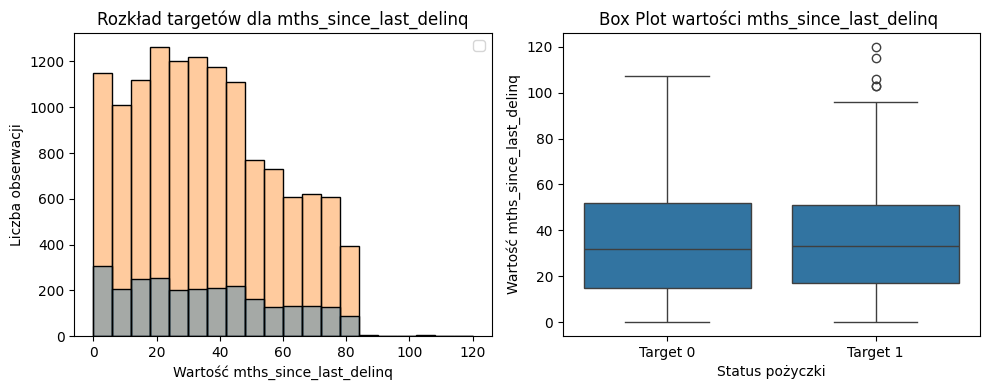

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))  # 2 wiersze, 1 kolumna

sns.histplot(data=data_msld_new, hue = 'loan_status', x='mths_since_last_delinq', bins=20, kde=False, color='blue', alpha=0.4,  ax=axs[0])
#sns.histplot(data=data_msld_new_1, x='mths_since_last_delinq', bins=20, kde=False, color='green', alpha=0.4, label='Target 1', ax=axs[0])
axs[0].set_title('Rozkład targetów dla mths_since_last_delinq')
axs[0].set_xlabel('Wartość mths_since_last_delinq')
axs[0].set_ylabel('Liczba obserwacji')
axs[0].legend()

sns.boxplot(x='loan_status', y='mths_since_last_delinq', data=data_msld_new, ax=axs[1])
axs[1].set_title('Box Plot wartości mths_since_last_delinq ')
axs[1].set_xlabel('Status pożyczki')
axs[1].set_ylabel('Wartość mths_since_last_delinq')
axs[1].set_xticklabels(['Target 0', 'Target 1'])

plt.tight_layout()
plt.show()

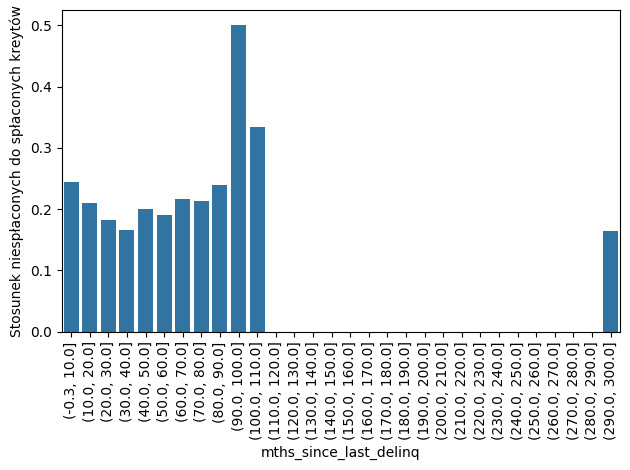

In [34]:
sns.barplot(x='bins', y='ratio', data=ratio_0_1_num('mths_since_last_delinq', data, 30))
plt.xlabel('mths_since_last_delinq')
plt.ylabel('Stosunek niespłaconych do spłaconych kreytów')
plt.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

*Nie widać wyraźnej różnicy w rozkładzie wartości zmiennej w zależności od predykcji 0 i jeden dla zbioru po usunięciu klientów którzy nie zostali zarejestrowani jako zalegający z płatnością. Natomiat stosunk kredytów niespłaconych do spłaconych dla zbioru klientór niezarejestrowanych był nizszy niż dla klientów zaleajacych z płatnoscią. Różnice nie są znaczące ale widoczne i potwierdzają celowość binaryzacji zmiennej.*

In [35]:
data['mths_since_last_delinq_new']=data['mths_since_last_delinq'].apply(lambda x: 0 if x ==300 else 1)

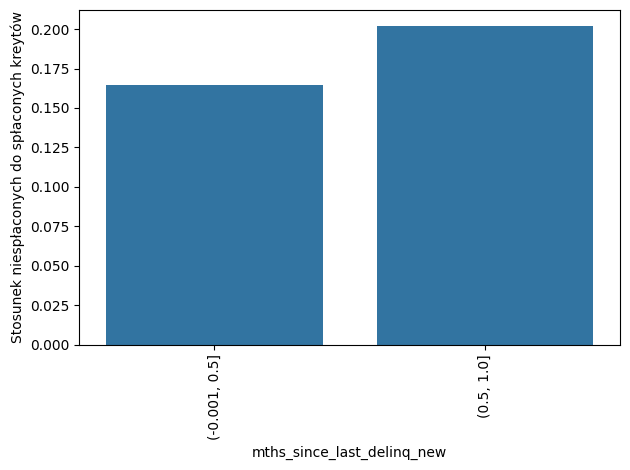

In [36]:
sns.barplot(x='bins', y='ratio', data=ratio_0_1_num('mths_since_last_delinq_new', data, 2))
plt.xlabel('mths_since_last_delinq_new')
plt.ylabel('Stosunek niespłaconych do spłaconych kreytów')
plt.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

In [37]:
data[['loan_status', 'mths_since_last_delinq_new']].corr()

,loan_status,mths_since_last_delinq_new
loan_status,1.000000,-0.035785
mths_since_last_delinq_new,-0.035785,1.000000


*Po zmianie zmiennej na binarną widać bardzo małą różnicę w spałacalności kredytu pomiędzy tymi grupami*

In [38]:
data_mrec_new = data_num[data_num['mths_since_last_record'] != 300]

<ipython-input-39-1829b9db9594>:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1].set_xticklabels(['Target 0', 'Target 1'])


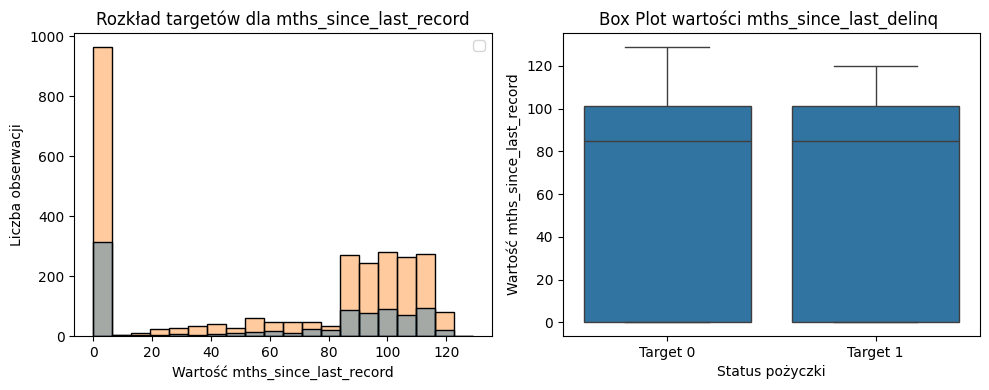

In [39]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))  # 2 wiersze, 1 kolumna

sns.histplot(data=data_mrec_new, hue = 'loan_status', x='mths_since_last_record', bins=20, kde=False, color='blue', alpha=0.4,  ax=axs[0])
#sns.histplot(data=data_msld_new_1, x='mths_since_last_delinq', bins=20, kde=False, color='green', alpha=0.4, label='Target 1', ax=axs[0])
axs[0].set_title('Rozkład targetów dla mths_since_last_record')
axs[0].set_xlabel('Wartość mths_since_last_record')
axs[0].set_ylabel('Liczba obserwacji')
axs[0].legend()

sns.boxplot(x='loan_status', y='mths_since_last_record', data=data_mrec_new, ax=axs[1])
axs[1].set_title('Box Plot wartości mths_since_last_delinq ')
axs[1].set_xlabel('Status pożyczki')
axs[1].set_ylabel('Wartość mths_since_last_record')
axs[1].set_xticklabels(['Target 0', 'Target 1'])

plt.tight_layout()
plt.show()

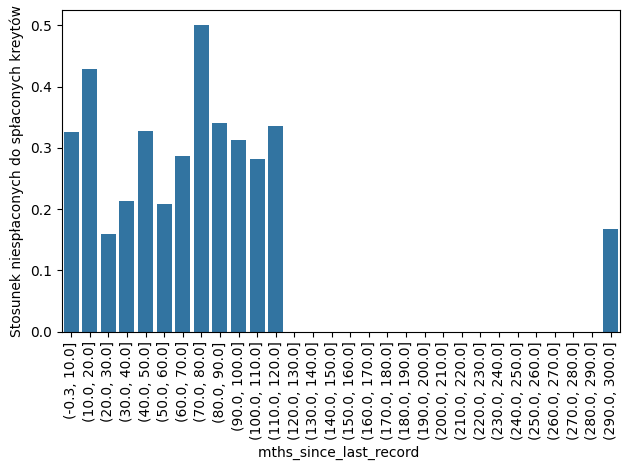

In [40]:
sns.barplot(x='bins', y='ratio', data=ratio_0_1_num('mths_since_last_record', data, 30))
plt.xlabel('mths_since_last_record ')
plt.ylabel('Stosunek niespłaconych do spłaconych kreytów')
plt.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

In [41]:
data_num[['loan_status', 'mths_since_last_record']].corr()


,loan_status,mths_since_last_record
loan_status,1.000000,0.074554
mths_since_last_record,0.074554,1.000000


*Nie widać wyraźnej różnicy w rozkładzie wartości zmiennej w zależności od predykcji 0 i 1 dla zbioru po usunięciu klientów którzy nie zostali zarejestrowani w rejestrze. Stosunk kredytów niespłaconych do spłaconych dla zbioru klientór niezarejestrowanych był nizszy niż dla klientów zarejestrowanych. Różnice nie są jednak znaczące a zmiennosć wśród klientów zarejestrowanych duża. Do sprawdzenia jak zmienna będzie zachowywać się po binaryzacji.*

In [42]:
data['mths_since_last_record_new']=data['mths_since_last_record'].apply(lambda x: 0 if x ==300 else 1)

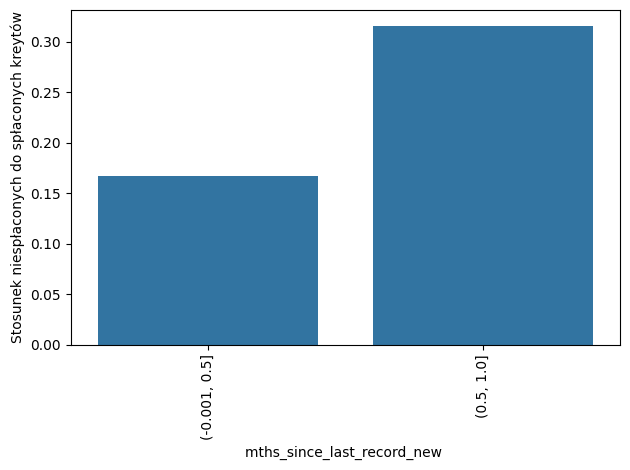

In [43]:
sns.barplot(x='bins', y='ratio', data=ratio_0_1_num('mths_since_last_record_new', data, 2))
plt.xlabel('mths_since_last_record_new ')
plt.ylabel('Stosunek niespłaconych do spłaconych kreytów')
plt.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

In [44]:
data[['loan_status', 'mths_since_last_record_new']].corr()

,loan_status,mths_since_last_record_new
loan_status,1.000000,-0.075895
mths_since_last_record_new,-0.075895,1.000000


*Po binaryzacji widać różnicę w stosunku spłaconychdo niespłaconych kredytów. Ale nalezy pamietac o duzych wahaniach tego parametru dla wartości nieusrednionych*

#### <a name = '2312'></a> 2.3.1.2 Analiza zmiennej 'annual_inc_log' i 'revol_bal'

Obie zmienne dla celów wizualizacji wymagaja przeprowadzenia logarytmowania.

In [45]:
data['annual_inc_log'] = np.log(data['annual_inc'])

In [46]:
data['annual_inc_log'].head()

,annual_inc_log
0,10.085809
1,10.308953
2,9.413444
3,10.803649
4,11.289782


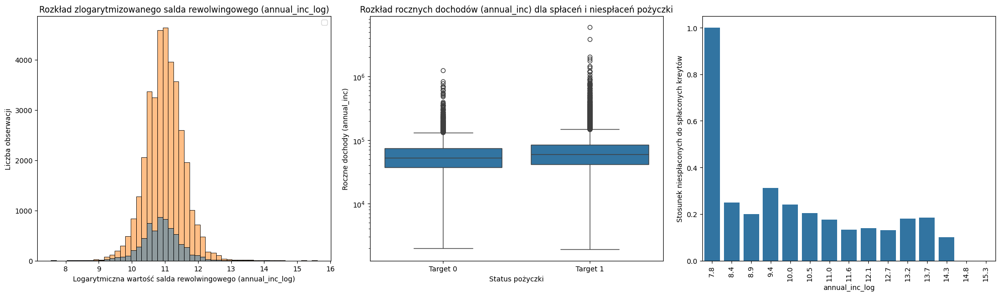

<Figure size 640x480 with 0 Axes>

In [47]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
sns.histplot(data=data, x='annual_inc_log', hue='loan_status', bins=50, ax=axs[0])
axs[0].set_title('Rozkład zlogarytmizowanego salda rewolwingowego (annual_inc_log)')
axs[0].set_xlabel('Logarytmiczna wartość salda rewolwingowego (annual_inc_log)')
axs[0].set_ylabel('Liczba obserwacji')
axs[0].legend()

sns.boxplot(x='loan_status', y='annual_inc', data=data, ax=axs[1])
axs[1].set_title('Rozkład rocznych dochodów (annual_inc) dla spłaceń i niespłaceń pożyczki')
axs[1].set_xlabel('Status pożyczki')
axs[1].set_ylabel('Roczne dochody (annual_inc)')
axs[1].set_xticks([0, 1])
axs[1].set_xticklabels(['Target 0', 'Target 1'])
axs[1].set_yscale('log')

sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num('annual_inc_log', data, 15),  ax=axs[2])
axs[2].set_xlabel('annual_inc_log')
axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
axs[2].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

plt.tight_layout()

plt.show()



*Dla zakresu wynagrodzeń w których występuje najwięcej obserwcji stosunek niespłaconych do spłaconych wartości kredytu utrzymuje się na względnie stałym poziomie. Jednak dla wartości początkowych i końcowych, szczególnie tych mniejszych jest dość wysoki.*

In [48]:
Q1 = data['annual_inc_log'].quantile(0.25)
Q2 = data['annual_inc_log'].quantile(0.5)
Q3 = data['annual_inc_log'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
upper_value = data[data['annual_inc_log'] > upper_bound]['annual_inc_log']
lower_value = data[data['annual_inc_log'] < lower_bound]['annual_inc_log']
print(f'Ilosc wartości powyżej wąsów dla zmiennej annual_inc_log: {upper_value.shape}')
print(f'Wartosć min: {upper_value.min()}, wartosci max: {upper_value.max()}')
print(f'Ilosc wartości poniżej wąsów dla zmiennej annual_inc_log: {lower_value.shape}')
print(f'Wartosć min: {lower_value.min()}, wartosci max: {lower_value.max()}')

Ilosc wartości powyżej wąsów dla zmiennej annual_inc_log: (421,)
Wartosć min: 12.409013489526863, wartosci max: 15.60727002719233
Ilosc wartości poniżej wąsów dla zmiennej annual_inc_log: (364,)
Wartosć min: 7.547501682814967, wartosci max: 9.51044496442652


In [49]:
print(Q1)
print(Q2)
print(Q3)

10.596634733096073
10.985292722887856
11.320553572322773


In [50]:

data[data['annual_inc_log'] < 9.5].shape

(357, 39)

In [51]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym < zakresu
round(data[(data['annual_inc_log'] < 9.5) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] < 9.5) & (data['loan_status'] ==1)].shape[0], 2)

0.33

In [52]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym od donego zakreu do Q1
round(data[(data['annual_inc_log'] > 9.5) & (data['annual_inc_log'] < 10.6) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] > 9.5) & (data['annual_inc_log'] < 10.6) & (data['loan_status'] ==1)].shape[0], 2)

0.22

In [53]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym Q1 -Q2
round(data[(data['annual_inc_log'] > 10.6) & (data['annual_inc_log'] < 10.99) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] > 10.6) & (data['annual_inc_log'] < 10.99) & (data['loan_status'] ==1)].shape[0], 2)

0.18

In [54]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym Q2 -Q3
round(data[(data['annual_inc_log'] > 10.99) & (data['annual_inc_log'] < 11.32) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] > 10.99) & (data['annual_inc_log'] < 11.32) & (data['loan_status'] ==1)].shape[0], 2)

0.17

In [55]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym Q3 - górny zakres
round(data[(data['annual_inc_log'] > 11.32) & (data['annual_inc_log'] < 12.41) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] > 11.32) & (data['annual_inc_log'] < 12.41) & (data['loan_status'] ==1)].shape[0], 2)

0.13

In [56]:
#stosunek niespłaconych do spłaconych kredytów przy dochodzie stanowiącym > górnego zakresu
round(data[(data['annual_inc_log'] > 12.41) & (data['annual_inc_log'] < 15.61) & (data['loan_status'] ==0)].shape[0]/data[(data['annual_inc_log'] > 12.41) & (data['annual_inc_log'] < 15.61) & (data['loan_status'] ==1)].shape[0], 2)

0.14

In [57]:
# Przekształcenie zmiennej na kategoryczną
data['annual_inc_cat'] = data['annual_inc_log'].apply(lambda x: 'low_outlier' if x < 9.5 else ('low-Q1' if x >9.5 and x< 10.6 else('Q1-Q2' if x>10.6 and x<10.99 else('Q2-Q3' if x> 10.99 and x<11.32 else('Q3-upper' if x>11.32 and x<12.41 else 'high_outlier')))))

<ipython-input-26-da98f8a15aaa>:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data_grouped = data_grouped.groupby([col, 'loan_status']).size()


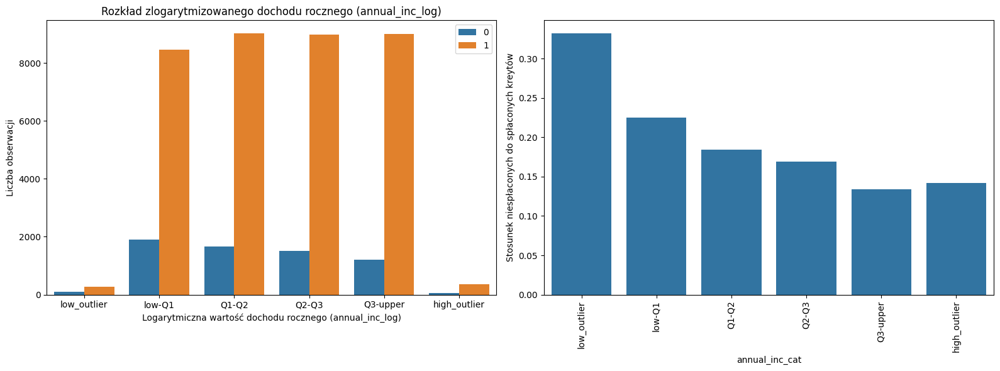

In [58]:
order = ['low_outlier', 'low-Q1', 'Q1-Q2', 'Q2-Q3', 'Q3-upper', 'high_outlier']
data1 = data.copy()
data1['annual_inc_cat'] = pd.Categorical(data['annual_inc_cat'], categories=order, ordered=True)

fig, axs = plt.subplots(1, 2, figsize=(16, 6))
sns.countplot(data=data1, x='annual_inc_cat', hue='loan_status',  ax=axs[0])
axs[0].set_title('Rozkład zlogarytmizowanego dochodu rocznego (annual_inc_log)')
axs[0].set_xlabel('Logarytmiczna wartość dochodu rocznego (annual_inc_log)')
axs[0].set_ylabel('Liczba obserwacji')
axs[0].legend()

sns.barplot(x='annual_inc_cat', y='ratio', data=ratio_0_1('annual_inc_cat', data1), ax=axs[1])
axs[1].set_xlabel('annual_inc_cat')
axs[1].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
axs[1].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()


*W zakresie gdzie wystepuje najwięcej obserwacji stosunek niespłaconych do spłaconych kredytów spada nieznacznie ze wzrostem dochodu.*

<ipython-input-59-c8951945757f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_num['revol_bal_log'] = np.log(data_num['revol_bal'] + 1)


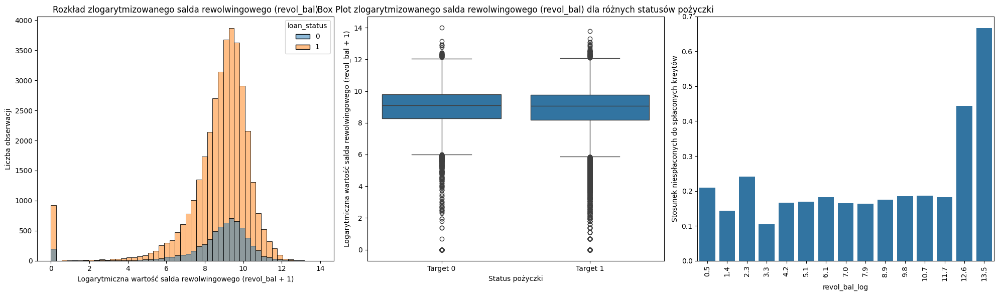

<Figure size 640x480 with 0 Axes>

In [59]:

# Dodanie małej wartości do revol_bal, aby uniknąć log(0)
data_num['revol_bal_log'] = np.log(data_num['revol_bal'] + 1)
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

sns.histplot(data=data_num, x='revol_bal_log', hue='loan_status', bins=50, ax=axs[0])
axs[0].set_title('Rozkład zlogarytmizowanego salda rewolwingowego (revol_bal)')
axs[0].set_xlabel('Logarytmiczna wartość salda rewolwingowego (revol_bal + 1)')
axs[0].set_ylabel('Liczba obserwacji')

sns.boxplot(x='loan_status', y='revol_bal_log', data=data_num, ax=axs[1])
axs[1].set_title('Box Plot zlogarytmizowanego salda rewolwingowego (revol_bal) dla różnych statusów pożyczki')
axs[1].set_xlabel('Status pożyczki')
axs[1].set_ylabel('Logarytmiczna wartość salda rewolwingowego (revol_bal + 1)')
axs[1].set_xticks([0, 1])
axs[1].set_xticklabels(['Target 0', 'Target 1'])

sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num('revol_bal_log', data_num, 15),  ax=axs[2])
axs[2].set_xlabel('revol_bal_log')
axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
axs[2].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

plt.tight_layout()

plt.tight_layout()
plt.show()



*Rozkład zmiennej revol_bal nie wykazuje istotnych różnic w rozkładzie dla wartości targetu 0 i 1. Zmienna posiada duzo outlierów a stosunek niespłaconych do spłaconych kredytów w zakresie występowania najwiekszej liczby obserwacji utrzymywał się na stałym poziomie.*

#### <a name = '232'></a> 2.3.2 Analiza statystyczna zmiennych numerycznych

In [60]:
data_num = data.select_dtypes(include=['number'])

In [61]:
data_num_0 = data_num[data_num['loan_status']==0]
data_num_1 = data_num[data_num['loan_status']==1]

In [62]:
data_num_col = data_num.columns.tolist()

In [63]:
data_num_col

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'sub_grade',
 'annual_inc',
 'loan_status',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'emp_length_num',
 'grade_num',
 'fico_value',
 'term_numeric',
 'mths_since_last_delinq_new',
 'mths_since_last_record_new',
 'annual_inc_log']

In [64]:
data_num_col.remove('loan_status' )

*Analiza statystyczna wykonana zostanie przy uzyciu testów U Mann-Whitneya i t-Studenta.*

In [65]:
for col in data_num_col:
    stat, p_value = mannwhitneyu(data_num_0[col], data_num_1[col])
    print(f' {col}: Statystyka ={stat} , p_value ={p_value}')
    print('---------------------------------------------------------')

 loan_amnt: Statystyka =122282105.0 , p_value =7.821752724180114e-12
---------------------------------------------------------
 funded_amnt: Statystyka =121898936.5 , p_value =1.3742253191222649e-10
---------------------------------------------------------
 funded_amnt_inv: Statystyka =115638514.5 , p_value =0.6268019449355136
---------------------------------------------------------
 int_rate: Statystyka =152801331.5 , p_value =0.0
---------------------------------------------------------
 installment: Statystyka =119311530.5 , p_value =0.00036672407592586436
---------------------------------------------------------
 sub_grade: Statystyka =153672395.0 , p_value =0.0
---------------------------------------------------------
 annual_inc: Statystyka =103267294.0 , p_value =2.6478590298870955e-45
---------------------------------------------------------
 dti: Statystyka =124226618.5 , p_value =2.674818432275172e-19
---------------------------------------------------------
 delinq_2yrs: St

In [66]:
for col in data_num_col:
    stat, p_value = ttest_ind(data_num_0[col], data_num_1[col])
    print(f'Test t-Studenta dla {col}: Statystyka = {stat} p_value ={p_value:.6f}')

Test t-Studenta dla loan_amnt: Statystyka = 8.78437686175629 p_value =0.000000
Test t-Studenta dla funded_amnt: Statystyka = 8.16834493000039 p_value =0.000000
Test t-Studenta dla funded_amnt_inv: Statystyka = 2.0331367424444764 p_value =0.042045
Test t-Studenta dla int_rate: Statystyka = 42.21484763097859 p_value =0.000000
Test t-Studenta dla installment: Statystyka = 4.346287548267872 p_value =0.000014
Test t-Studenta dla sub_grade: Statystyka = 42.89708964031605 p_value =0.000000
Test t-Studenta dla annual_inc: Statystyka = -7.840899698386791 p_value =0.000000
Test t-Studenta dla dti: Statystyka = 8.69719872094251 p_value =0.000000
Test t-Studenta dla delinq_2yrs: Statystyka = 4.021483574065713 p_value =0.000058
Test t-Studenta dla inq_last_6mths: Statystyka = 23.00722144375209 p_value =0.000000
Test t-Studenta dla mths_since_last_delinq: Statystyka = -7.53530348081478 p_value =0.000000
Test t-Studenta dla mths_since_last_record: Statystyka = -15.417919539764345 p_value =0.000000
Te

*Zgodnie z przeprowadzoną analizą statystyczną, wyniki testów U Manna-Whitneya oraz t-Studenta wskazują, że zmienne opec_acc i funded_amnt_inv nie wykazują istotnego statystycznie wpływu na zmienną docelową (target). Testy te nie są zbieżne z obserwacjami, które wykazały że spośród analizowanych zmiennych numerycznych zmienne:'term', 'int_rate','installment', 'grade', 'sub_grade', 'emp_length', 'pub_rec', 'revol_util', 'pub_rec_bankruptcies', 'emp_length_num', 'fico_value', 'mths_since_last_delinq_new,'annual_inc_cat' wykazują zależność wartości od predykcji 0 lub 1.*

 #### <a name = '24'></a> 2.4 Analiza zmiennych kategorycznych

In [67]:
columns_cat = data.select_dtypes(exclude=['number']).columns.tolist()

In [68]:
data_cat = data[columns_cat]

In [69]:
data_cat = pd.concat([data_cat, data['loan_status']], axis = 1)

In [70]:
data_cat.head()

,term,grade,emp_length,home_ownership,verification_status,issue_d,desc,purpose,title,zip_code,addr_state,earliest_cr_line,fico_category,annual_inc_cat,loan_status
0,36 months,B,10+ years,RENT,Verified,2011-12-01,Borrower added on 12/22/11 > I need to upgra...,credit_card,Borrower added on 12/22/11 > I need to upgra...,860xx,AZ,1985-01-01,Good,low-Q1,1
1,60 months,C,< 1 year,RENT,Source Verified,2011-12-01,Borrower added on 12/22/11 > I plan to use t...,car,Borrower added on 12/22/11 > I plan to use t...,309xx,GA,1999-04-01,Very_good,low-Q1,0
2,36 months,C,10+ years,RENT,Not Verified,2011-12-01,0,small_business,0,606xx,IL,2001-11-01,Good,low_outlier,1
3,36 months,C,10+ years,RENT,Source Verified,2011-12-01,Borrower added on 12/21/11 > to pay for prop...,other,Borrower added on 12/21/11 > to pay for prop...,917xx,CA,1996-02-01,Good,Q1-Q2,1
4,60 months,B,1 year,RENT,Source Verified,2011-12-01,Borrower added on 12/21/11 > I plan on combi...,other,Borrower added on 12/21/11 > I plan on combi...,972xx,OR,1996-01-01,Good,Q2-Q3,1


In [71]:
for col in data_cat.columns[: -1]:
    print(f'W kolumnie: {col} występują następujące wartości:')
    print(data_cat[col].value_counts().head(20).sort_values(ascending = False))
    print(f'Ilość możliwych unikalnych wartosci dla zmiennej: "{col}" wynosi: {len(data_cat[col].value_counts())}')
    print('\n')

W kolumnie: term występują następujące wartości:
term
36 months    31530
60 months    11001
Name: count, dtype: int64
Ilość możliwych unikalnych wartosci dla zmiennej: "term" wynosi: 2


W kolumnie: grade występują następujące wartości:
grade
B    12389
A    10179
C     8740
D     6016
E     3394
F     1301
G      512
Name: count, dtype: int64
Ilość możliwych unikalnych wartosci dla zmiennej: "grade" wynosi: 7


W kolumnie: emp_length występują następujące wartości:
emp_length
10+ years    9369
< 1 year     5058
2 years      4743
3 years      4364
4 years      3649
1 year       3595
5 years      3458
6 years      2375
7 years      1875
8 years      1592
9 years      1341
brak         1112
Name: count, dtype: int64
Ilość możliwych unikalnych wartosci dla zmiennej: "emp_length" wynosi: 12


W kolumnie: home_ownership występują następujące wartości:
home_ownership
RENT        20181
MORTGAGE    18959
OWN          3251
OTHER         140
Name: count, dtype: int64
Ilość możliwych unikalnych w

In [72]:
data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,emp_length_num,grade_num,fico_value,fico_category,term_numeric,mths_since_last_delinq_new,mths_since_last_record_new,annual_inc_log,annual_inc_cat
0,5000.0,5000.0,4975.0,36 months,10.6,162.87,B,1.2,10+ years,RENT,24000.0,Verified,2011-12-01,1,Borrower added on 12/22/11 > I need to upgra...,credit_card,Borrower added on 12/22/11 > I need to upgra...,860xx,AZ,27.65,0.0,1985-01-01,1.0,300.0,300.0,3.0,0.0,13648.0,83.7,9.0,0.0,10,1,737.0,Good,36,0,0,10.085809,low-Q1
1,2500.0,2500.0,2500.0,60 months,15.3,59.83,C,2.4,< 1 year,RENT,30000.0,Source Verified,2011-12-01,0,Borrower added on 12/22/11 > I plan to use t...,car,Borrower added on 12/22/11 > I plan to use t...,309xx,GA,1.00,0.0,1999-04-01,5.0,300.0,300.0,3.0,0.0,1687.0,9.4,4.0,0.0,0,2,742.0,Very_good,60,0,0,10.308953,low-Q1
2,2400.0,2400.0,2400.0,36 months,16.0,84.33,C,2.5,10+ years,RENT,12252.0,Not Verified,2011-12-01,1,0,small_business,0,606xx,IL,8.72,0.0,2001-11-01,2.0,300.0,300.0,2.0,0.0,2956.0,98.5,10.0,0.0,10,2,737.0,Good,36,0,0,9.413444,low_outlier
3,10000.0,10000.0,10000.0,36 months,13.5,339.31,C,2.1,10+ years,RENT,49200.0,Source Verified,2011-12-01,1,Borrower added on 12/21/11 > to pay for prop...,other,Borrower added on 12/21/11 > to pay for prop...,917xx,CA,20.00,0.0,1996-02-01,1.0,35.0,300.0,10.0,0.0,5598.0,21.0,37.0,0.0,10,2,692.0,Good,36,1,0,10.803649,Q1-Q2
4,3000.0,3000.0,3000.0,60 months,12.7,67.79,B,1.5,1 year,RENT,80000.0,Source Verified,2011-12-01,1,Borrower added on 12/21/11 > I plan on combi...,other,Borrower added on 12/21/11 > I plan on combi...,972xx,OR,17.94,0.0,1996-01-01,0.0,38.0,300.0,15.0,0.0,27783.0,53.9,38.0,0.0,1,1,697.0,Good,60,1,0,11.289782,Q2-Q3


In [73]:
# Kolumny przewidziane do analizy, niektóre z kategorycznych były juz wczesniej przeanalizowane
data_cat_c= ['home_ownership', 'verification_status', 'purpose', 'addr_state','fico_category']

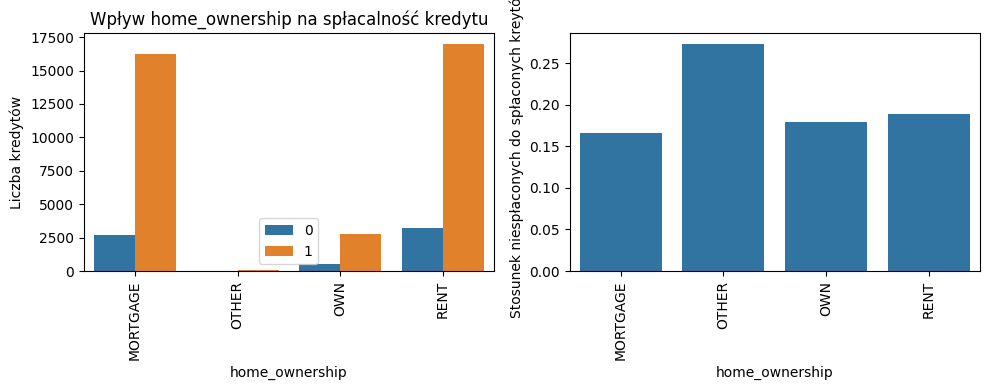

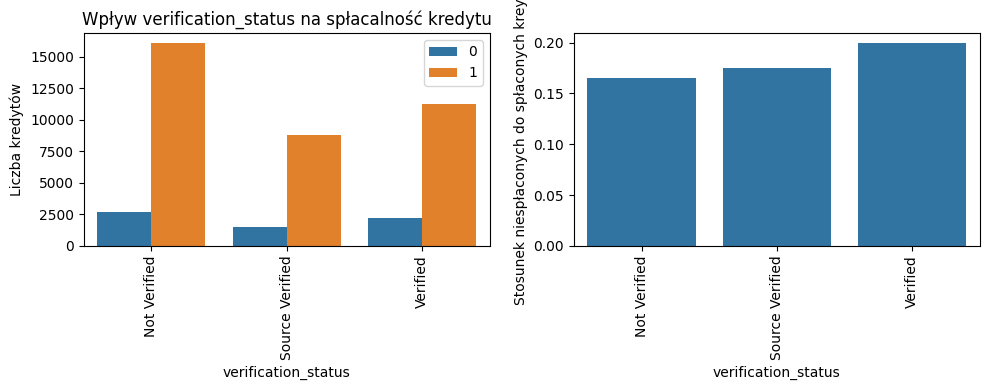

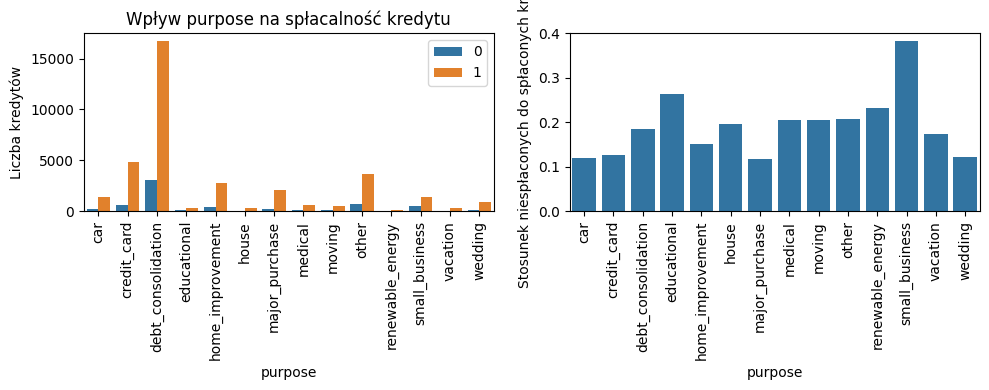

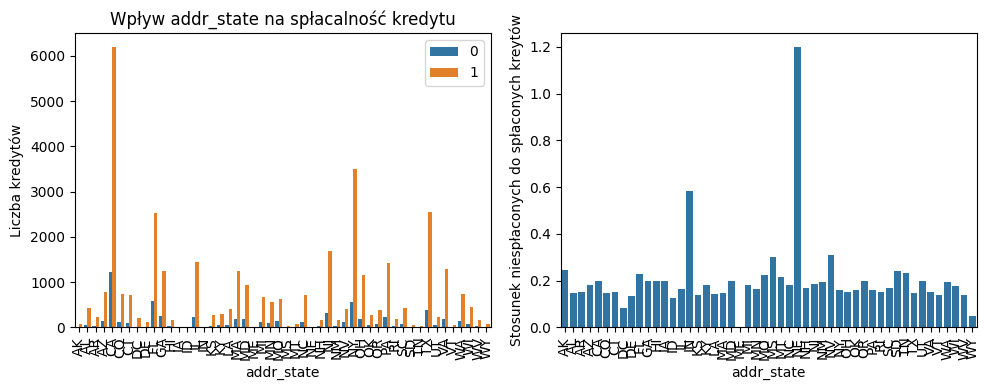

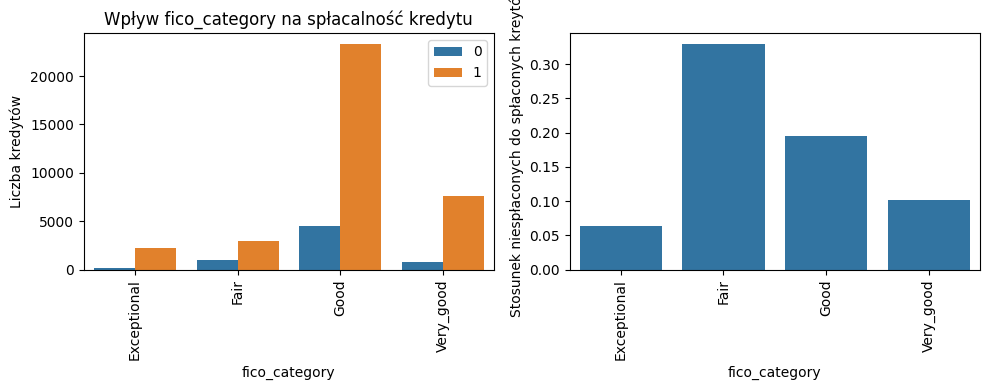

In [74]:
for col in data_cat_c:
    order = sorted(data[col].unique())

    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    sns.countplot(x=col, hue='loan_status', data=data_cat, ax=axs[0], order=order)
    axs[0].set_title(f'Wpływ {col} na spłacalność kredytu')
    axs[0].set_xlabel(col)
    axs[0].set_ylabel('Liczba kredytów')
    axs[0].tick_params(axis='x', rotation=90)
    axs[0].legend( labels=['0', '1'])

    sns.barplot(x=col, y='ratio', data=ratio_0_1(col, data),  ax=axs[1])
    axs[1].set_xlabel(col)
    axs[1].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
    axs[1].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()

*Wprzypadku zmienneych kategorycznych przedstawionych w zestawieniu powyżej widać wraźny wpływ wartości zmiennej na target w przypadku zmiennej fico_catategory i purpose, słaby w przypadku veryfication_status i home_ownership i brak w przypadku pozostałych.*


 #### <a name = '241'></a> 2.4.1 Zmienna 'zip_code'

In [75]:
data_zip =ratio_0_1('zip_code', data)
zip_mean = data_zip['ratio'].mean()
zip_std = data_zip['ratio'].std()
zip_mode = data_zip['ratio'].mode()[0]
print(round(zip_mean, 3))
print(round(zip_std, 3))
print(zip_mode)


0.234
0.205
0.25


In [76]:
data_zip.shape

(837, 4)

In [77]:
data_zip = data_zip[data_zip['ratio'].notna()]

In [78]:
data_zip.shape

(687, 4)

In [79]:
data_zip['zip_code'].str.strip()
data_zip['zip_code'] = data_zip['zip_code'].str.replace('xx', '')
data_zip['zip_code'] = data_zip['zip_code'].astype(int)

<Axes: xlabel='zip_code', ylabel='ratio'>

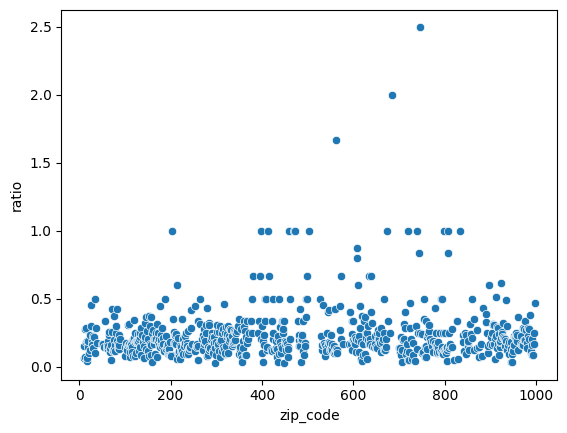

In [80]:
sns.scatterplot(x = 'zip_code', y = 'ratio', data = data_zip)

*Wiekszość obserwacji mieści sie w przedziale pomiedzy 0 a 0.5, choc trafiaja się przypadki powyżej tej wartości.*


In [81]:
#Utworzenie zmiennej suma - ilosc obserwacji dla danego ratio
data_zip['suma'] = data_zip[0]+data_zip[1]

In [82]:
data_zip['ratio'].max()

2.5

In [83]:
data_zip[data_zip['ratio']<0.1]['suma'].sum()

3822.0

In [84]:
data_zip[(data_zip['ratio']>0.1) & (data_zip['ratio']<.17)]['suma'].sum()

16686.0

In [85]:
data_zip[(data_zip['ratio']>0.17) & (data_zip['ratio']<.30)]['suma'].sum()

17899.0

In [86]:
data_zip[(data_zip['ratio']>0.30) & (data_zip['ratio']<2.5)]['suma'].sum()

3051.0

<Axes: xlabel='ratio', ylabel='suma'>

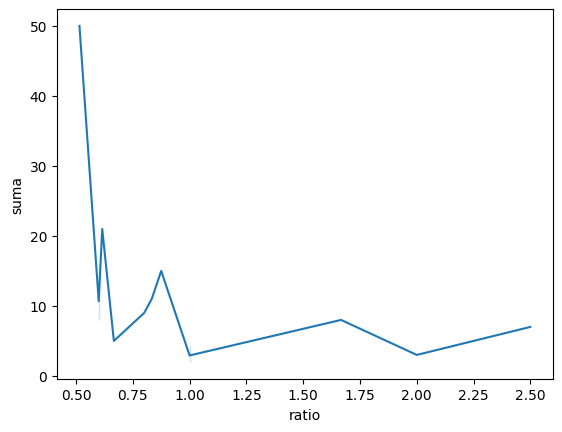

In [87]:
sns.lineplot(x = 'ratio', y = 'suma', data = data_zip[data_zip['ratio']>0.5])

In [88]:
data_zip[data_zip['ratio']<0.17]['suma'].sum()

20838.0

In [89]:
data_zip[data_zip['ratio']>0.17]['suma'].sum()


21087.0

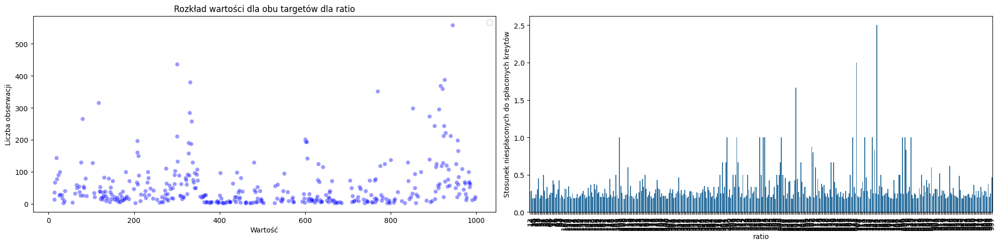

In [90]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))
sns.scatterplot(data=data_zip[data_zip['ratio']>0.17], x='zip_code',y = 'suma',  color='blue', alpha=0.4, ax=axs[0], )
axs[0].set_title('Rozkład wartości dla obu targetów dla ratio')
axs[0].set_xlabel('Wartość' )
axs[0].set_ylabel('Liczba obserwacji')
axs[0].legend()


sns.barplot(x='zip_code', y='ratio', data=data_zip[data_zip['ratio']>0.17],  ax=axs[1])
axs[1].set_xlabel('ratio')
axs[1].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
axs[1].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

*Zmienna zip_code wydaje się mieć wpływ, stosunek niespłaconych do spłaconych kredytów wiekszy od przeciętnej dla zbioru występuje w około połowie obserwacji.Do sprawdzenia podczas modelowania*

 #### <a name = '242'></a> 2.4.2 Analiza statystyczna

In [91]:
for col in data_cat_c:
    table = pd.crosstab(data_cat[col], data_cat['loan_status'])
    chi2, p_value, dof, expected = chi2_contingency(table)
    print(f'Zmienna: {col}')
    print("Chi-kwadrat statystyka:", chi2, 2)
    print("p-wartość:", p_value)

Zmienna: home_ownership
Chi-kwadrat statystyka: 25.26548462238391 2
p-wartość: 1.3587578328376666e-05
Zmienna: verification_status
Chi-kwadrat statystyka: 38.347744332035546 2
p-wartość: 4.708614347125706e-09
Zmienna: purpose
Chi-kwadrat statystyka: 426.2104182190679 2
p-wartość: 6.440691035285228e-83
Zmienna: addr_state
Chi-kwadrat statystyka: 184.37939118917532 2
p-wartość: 1.438578456682311e-17
Zmienna: fico_category
Chi-kwadrat statystyka: 697.704061953923 2
p-wartość: 6.605181604669137e-151


*Statystycznie, na podstawie testu chi kwadrat wszystkie zmienne wykazują statystyczna zalezność od targetu*

#### <a name = '25'></a> 2.5 Analiza zmiennych czasowych

In [92]:
#Analiza ilości i spłacalności kredytów w czasie
data['issue_d'] = pd.to_datetime(data['issue_d'])

In [93]:
data['issue_d'] = data['issue_d'].dt.to_period('M')



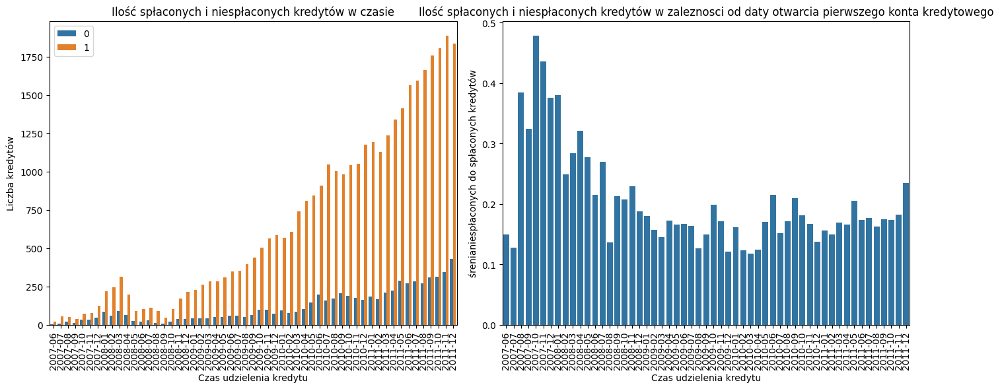

In [94]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

order = sorted(data['issue_d'].unique())
sns.countplot(x='issue_d', hue='loan_status', data=data, ax=axs[0], order=order)
axs[0].set_title('Ilość spłaconych i niespłaconych kredytów w czasie')
axs[0].set_xlabel('Czas udzielenia kredytu')
axs[0].set_ylabel('Liczba kredytów')
axs[0].tick_params(axis='x', rotation=90)
axs[0].legend()

sns.barplot(x='issue_d', y='ratio', data=ratio_0_1('issue_d', data),ax=axs[1], order=order)
axs[1].set_title('Ilość spłaconych i niespłaconych kredytów w zaleznosci od daty otwarcia pierwszego konta kredytowego')
axs[1].set_xlabel('Czas udzielenia kredytu')
axs[1].set_ylabel('śrenianiespłaconych do spłaconych kredytów')
axs[1].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()



*Stosunek niespłaconych do spłaconych kredytów był wyższy na początku czasooresu ale jest to wywołane małą ilościa danych. Później po roku 2008 ten stosunek utrzymywał się na względnie stałym poziomie.*

In [95]:
data_0= data[data['loan_status']==0]
data_1= data[data['loan_status']==1]

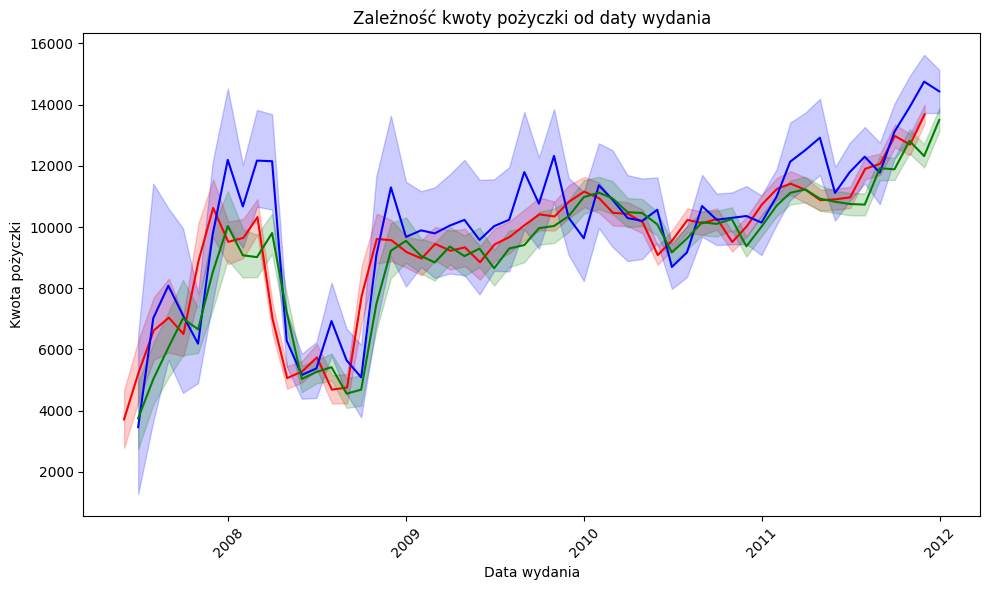

In [96]:
data['issue_d'] = data['issue_d'].dt.to_timestamp()

# Utworzenie wykresu
plt.figure(figsize=(10, 6))
sns.lineplot(data=data, x='issue_d', y='funded_amnt', color = 'red')
sns.lineplot(data=data_0, x='issue_d', y='funded_amnt', color = 'blue')
sns.lineplot(data=data_1, x='issue_d', y='funded_amnt', color = 'green')
plt.title('Zależność kwoty pożyczki od daty wydania')
plt.xlabel('Data wydania')
plt.ylabel('Kwota pożyczki')
plt.xticks(rotation=45)  # Obrót etykiet osi X dla lepszej czytelności
plt.tight_layout()

plt.show()

*Kredyty które nie zostały spłacone były zazwyczaj nieznacznie wyższe niż spłacone.*

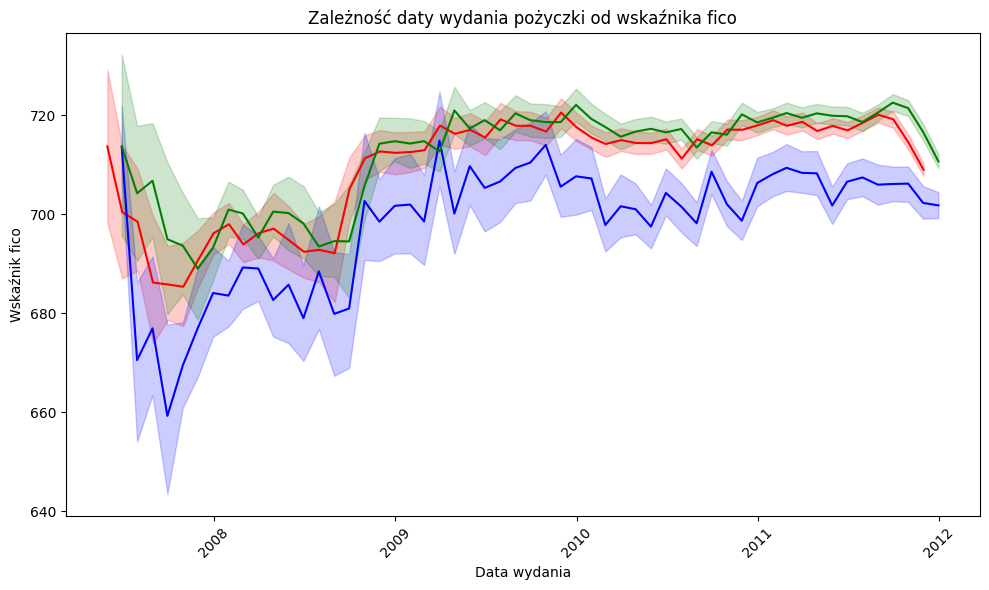

In [97]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=data, x='issue_d', y='fico_value', color = 'red')
sns.lineplot(data=data_0, x='issue_d', y='fico_value', color = 'blue')
sns.lineplot(data=data_1, x='issue_d', y='fico_value', color = 'green')
plt.title('Zależność daty wydania pożyczki od wskaźnika fico')
plt.xlabel('Data wydania')
plt.ylabel('Wskaźnik fico')
plt.xticks(rotation=45)  # Obrót etykiet osi X dla lepszej czytelności
plt.tight_layout()
plt.show()

*W całym analizowanym okresie wydawania pożyczek (może poza kwietniem 2009 i listopadem 2008) fico dla pożyczek niespłaconych było niższy niż dla spłaconych*

In [98]:

data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])

In [99]:
data['earliest_cr_line_Y'] = data['earliest_cr_line'].dt.to_period('Y')

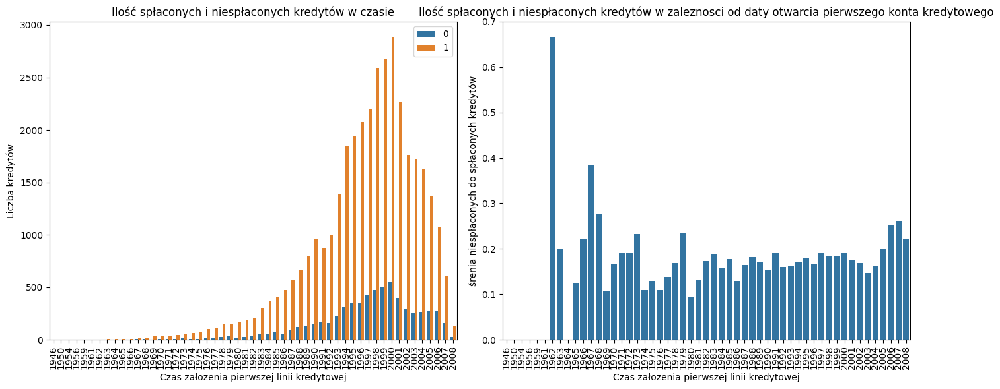

In [100]:
data_1 = data.copy()
data_1 = data_1.sort_values('earliest_cr_line_Y')
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(x='earliest_cr_line_Y', hue='loan_status', data=data_1, ax=axs[0])
axs[0].set_title('Ilość spłaconych i niespłaconych kredytów w czasie')
axs[0].set_xlabel('Czas załozenia pierwszej linii kredytowej')
axs[0].set_ylabel('Liczba kredytów')
axs[0].tick_params(axis='x', rotation=90)
axs[0].legend()


sns.barplot(x='earliest_cr_line_Y', y='ratio', data=ratio_0_1('earliest_cr_line_Y', data_1))
axs[1].set_title('Ilość spłaconych i niespłaconych kredytów w zaleznosci od daty otwarcia pierwszego konta kredytowego')
axs[1].set_xlabel('Czas załozenia pierwszej linii kredytowej')
axs[1].set_ylabel('śrenia niespłaconych do spłaconych kredytów')
axs[1].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

*Nie widać wyraźnej korelacji pomiędzy rokiem założenia konata kredytowego a stosunkiem niespłaconych do spłaconych kredytów. Wyższe wartości w poczatkowych latach są związane z mała ilością danych.*

#### <a name = '26'></a> 2.6 Podsumowanie - pytania projektowe

1) W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?



*FICO wywiera wpływ na na prawdopodobieństwo spłacenia pożyczki. Ze wzrostem wartości FICO spadał stosunek niespłaconych do spłaconych kredytów.*

2) W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO

*Kredyty udzielone na dłuższy okres czasu - 60 miesięcy wykazywały mniejszą spłacalność. Stosunek niespłaconych do spłaconych kredytów był dla nich dwukrotnie wyższy.*

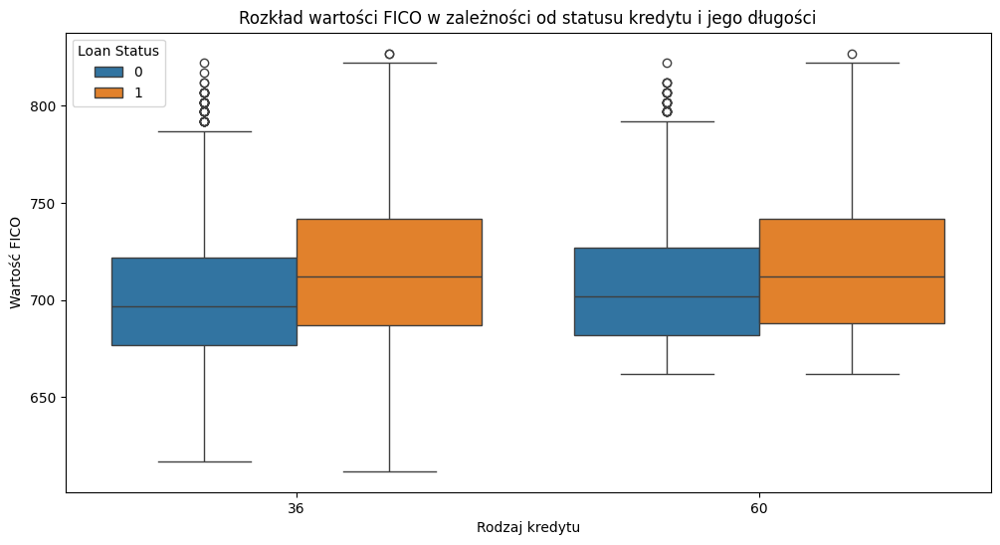

In [101]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='term_numeric', y='fico_value', hue='loan_status', data=data)
plt.title('Rozkład wartości FICO w zależności od statusu kredytu i jego długości')
plt.xlabel('Rodzaj kredytu')
plt.ylabel('Wartość FICO')
plt.legend(title='Loan Status')
plt.show()

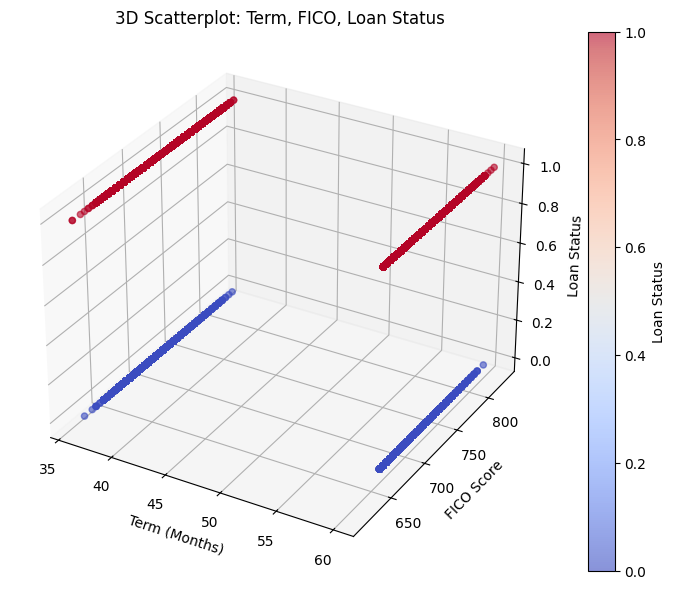

In [102]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    data['term_numeric'],
    data['fico_value'],
    data['loan_status'],
    c=data['loan_status'],
    cmap='coolwarm',
    alpha=0.6
)

ax.set_xlabel('Term (Months)')
ax.set_ylabel('FICO Score')
ax.set_zlabel('Loan Status')
plt.title('3D Scatterplot: Term, FICO, Loan Status')

plt.colorbar(scatter, ax=ax, label='Loan Status')
plt.show()


*Nie widać dodatkowego wpływu na spłacalność kredytów skorelowanego dodatkowo z FICO.*

3) W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?


In [103]:
data[data['home_ownership']=='OTHER'].shape[0]/data.shape[0]*100

0.3291716630222661

*Status hipoteki nie ma istotnego wpływu na spłacalność kredytów dla wszystkich trzech kategorii - hipoteka, własność, wynajem stosunek niespaconych do spłaconych kredtów jest na zbliżonym poziomie i wynosi około 0,18 oprócz kategorii other gdzie wzrósł około 0,27. Jednak ta kategoria jest bardzo nieliczna - stanowi 0.3%*

4) W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?


*Roczny dochód wykazywał wpływ na spłacalność pożyczki, choć zależność nie miała intensywnego przebiegu. Ze wzrostem dochodu spadał sotunek niespłaconych do spłaconych kredytów, choć dla przedziału Q3 - outliery pozostawał na bardzo zblizonym poziomie 0.13 - 0.14*

5) W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?


In [104]:
data[(data['emp_length_num']==20)&(data['loan_status']==0)].shape[0]/data[(data['emp_length_num']==20)&(data['loan_status']==1)].shape[0]

0.2825836216839677

*Historia zatrudnienia wiąże sie z prawdopodobieństwem niewykonania zobowiazania jedynie w taki sposób że prawdopodobieństwo to wzrasta przypadku osób które nie podały długosci okresu zatrudnienia. Stosunek ilości niespłaconych do spłaconych kredytów wśród klientów którzy podali okres zatrudnienia był zbliżony i wahał się pomiędzy 0.15-0.18, a dla klientów którzy nie podali tej informacji wynosił 0.28.*

6) Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

*Dla wielkości żądanej pożyczki można zaobserwować od pewnego momentu - 16000 wzrost stosunku niespłaconych do spłaconych kredytów. Jednak zależność ta pojawia się dla zakresu w którym występuje mało obserwacji.*

#### <a name = '27'></a> 2.7 Analiza wartości odstających

In [105]:
data_num = data.select_dtypes(include=['number']).columns.tolist()

Ilosc wartości powyżej wąsów dla zmiennej loan_amnt: (1218,)
Wartosć min: 29800.0, wartosci max: 35000.0
Ilosc wartości poniżej wąsów dla zmiennej loan_amnt: (0,)
Wartosć min: nan, wartosci max: nan


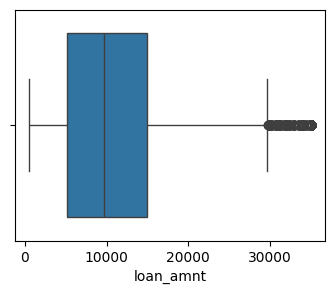

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej funded_amnt: (691,)
Wartosć min: 30100.0, wartosci max: 35000.0
Ilosc wartości poniżej wąsów dla zmiennej funded_amnt: (0,)
Wartosć min: nan, wartosci max: nan


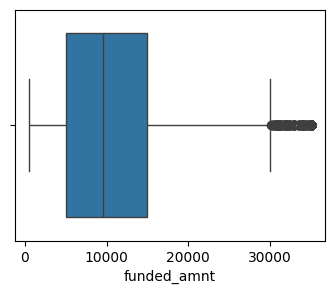

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej funded_amnt_inv: (1154,)
Wartosć min: 27597.149453609916, wartosci max: 35000.0
Ilosc wartości poniżej wąsów dla zmiennej funded_amnt_inv: (0,)
Wartosć min: nan, wartosci max: nan


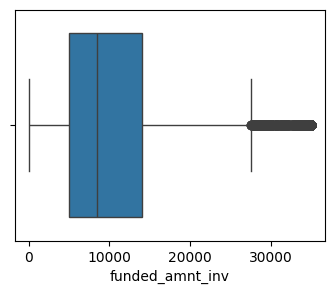

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej int_rate: (119,)
Wartosć min: 22.4, wartosci max: 24.6
Ilosc wartości poniżej wąsów dla zmiennej int_rate: (0,)
Wartosć min: nan, wartosci max: nan


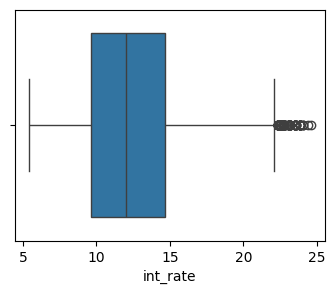

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej installment: (1393,)
Wartosć min: 822.74, wartosci max: 1305.19
Ilosc wartości poniżej wąsów dla zmiennej installment: (0,)
Wartosć min: nan, wartosci max: nan


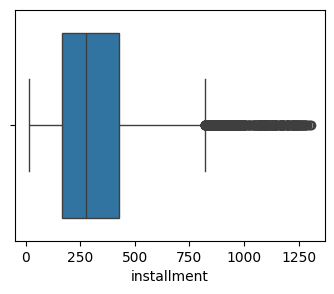

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej sub_grade: (371,)
Wartosć min: 6.2, wartosci max: 6.5
Ilosc wartości poniżej wąsów dla zmiennej sub_grade: (0,)
Wartosć min: nan, wartosci max: nan


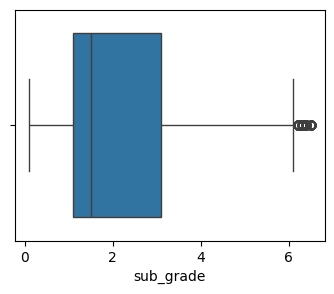

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej annual_inc: (2032,)
Wartosć min: 146760.0, wartosci max: 6000000.0
Ilosc wartości poniżej wąsów dla zmiennej annual_inc: (0,)
Wartosć min: nan, wartosci max: nan


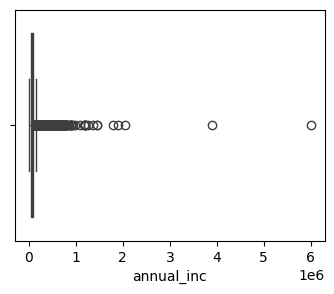

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej loan_status: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej loan_status: (6431,)
Wartosć min: 0, wartosci max: 0


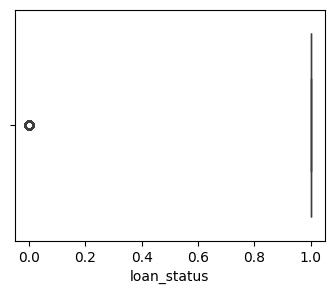

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej dti: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej dti: (0,)
Wartosć min: nan, wartosci max: nan


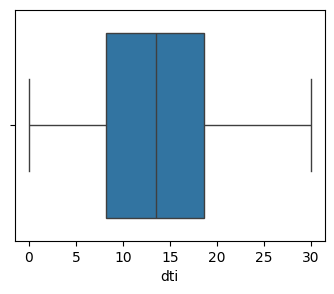

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej delinq_2yrs: (4735,)
Wartosć min: 1.0, wartosci max: 13.0
Ilosc wartości poniżej wąsów dla zmiennej delinq_2yrs: (0,)
Wartosć min: nan, wartosci max: nan


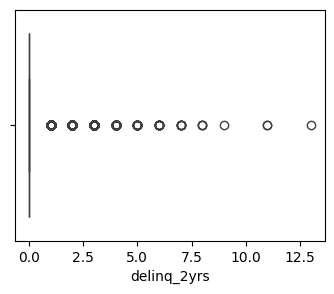

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej inq_last_6mths: (781,)
Wartosć min: 6.0, wartosci max: 33.0
Ilosc wartości poniżej wąsów dla zmiennej inq_last_6mths: (0,)
Wartosć min: nan, wartosci max: nan


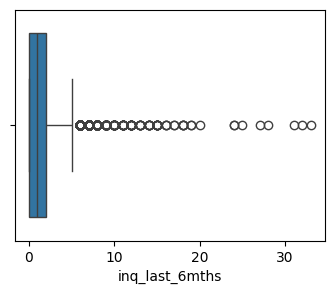

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej mths_since_last_delinq: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej mths_since_last_delinq: (0,)
Wartosć min: nan, wartosci max: nan


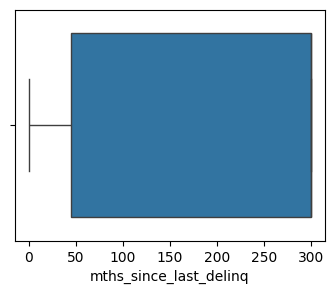

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej mths_since_last_record: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej mths_since_last_record: (3651,)
Wartosć min: 0.0, wartosci max: 129.0


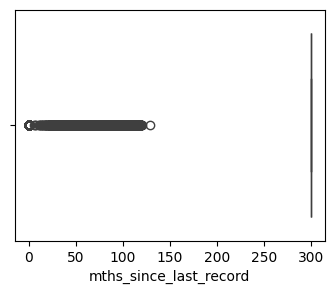

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej open_acc: (619,)
Wartosć min: 22.0, wartosci max: 47.0
Ilosc wartości poniżej wąsów dla zmiennej open_acc: (0,)
Wartosć min: nan, wartosci max: nan


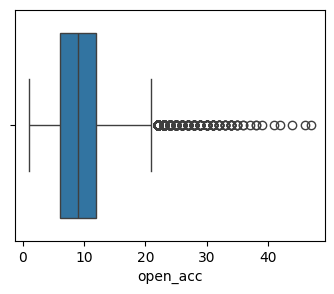

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej pub_rec: (2376,)
Wartosć min: 1.0, wartosci max: 5.0
Ilosc wartości poniżej wąsów dla zmiennej pub_rec: (0,)
Wartosć min: nan, wartosci max: nan


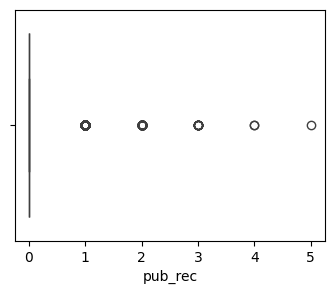

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej revol_bal: (2906,)
Wartosć min: 37677.0, wartosci max: 1207359.0
Ilosc wartości poniżej wąsów dla zmiennej revol_bal: (0,)
Wartosć min: nan, wartosci max: nan


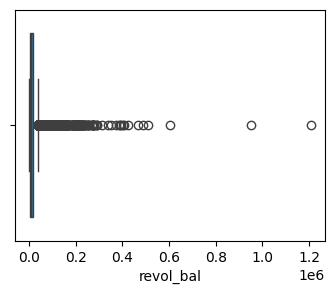

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej revol_util: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej revol_util: (0,)
Wartosć min: nan, wartosci max: nan


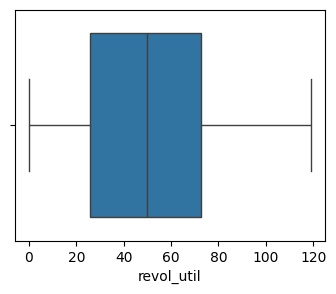

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej total_acc: (604,)
Wartosć min: 54.0, wartosci max: 90.0
Ilosc wartości poniżej wąsów dla zmiennej total_acc: (0,)
Wartosć min: nan, wartosci max: nan


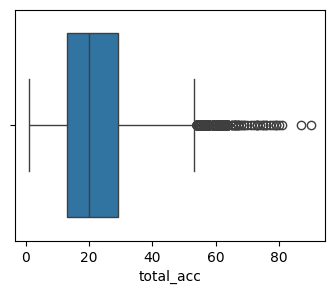

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej pub_rec_bankruptcies: (2649,)
Wartosć min: 1.0, wartosci max: 2.0
Ilosc wartości poniżej wąsów dla zmiennej pub_rec_bankruptcies: (0,)
Wartosć min: nan, wartosci max: nan


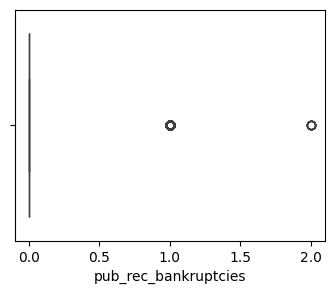

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej emp_length_num: (1112,)
Wartosć min: 20, wartosci max: 20
Ilosc wartości poniżej wąsów dla zmiennej emp_length_num: (0,)
Wartosć min: nan, wartosci max: nan


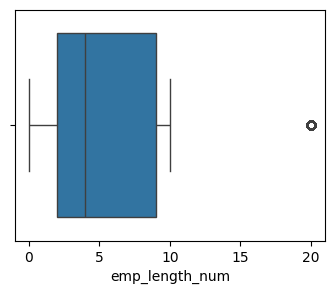

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej grade_num: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej grade_num: (0,)
Wartosć min: nan, wartosci max: nan


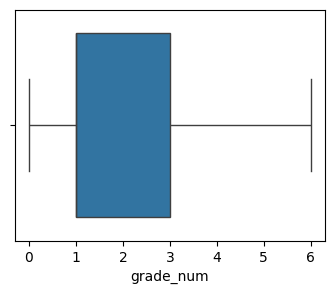

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej fico_value: (3,)
Wartosć min: 827.0, wartosci max: 827.0
Ilosc wartości poniżej wąsów dla zmiennej fico_value: (0,)
Wartosć min: nan, wartosci max: nan


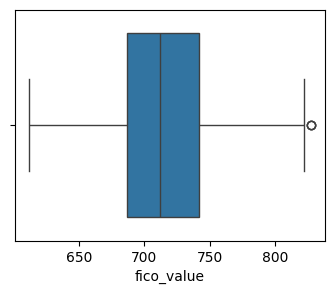

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej term_numeric: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej term_numeric: (0,)
Wartosć min: nan, wartosci max: nan


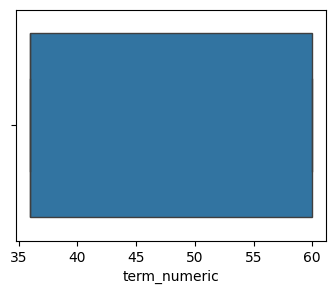

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej mths_since_last_delinq_new: (0,)
Wartosć min: nan, wartosci max: nan
Ilosc wartości poniżej wąsów dla zmiennej mths_since_last_delinq_new: (0,)
Wartosć min: nan, wartosci max: nan


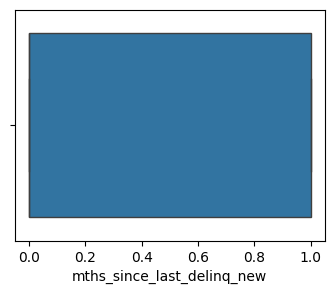

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej mths_since_last_record_new: (3651,)
Wartosć min: 1, wartosci max: 1
Ilosc wartości poniżej wąsów dla zmiennej mths_since_last_record_new: (0,)
Wartosć min: nan, wartosci max: nan


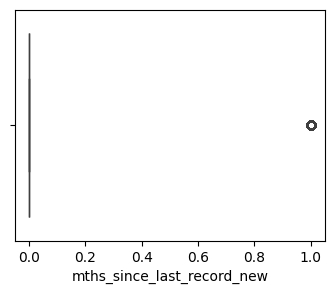

------------------------------------------------
Ilosc wartości powyżej wąsów dla zmiennej annual_inc_log: (421,)
Wartosć min: 12.409013489526863, wartosci max: 15.60727002719233
Ilosc wartości poniżej wąsów dla zmiennej annual_inc_log: (364,)
Wartosć min: 7.547501682814967, wartosci max: 9.51044496442652


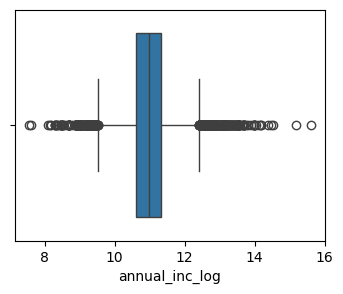

------------------------------------------------


In [106]:
for col in data_num:

  Q1 = data[col].quantile(0.25)
  Q3 = data[col].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  upper_value = data[data[col] > upper_bound][col]
  lower_value = data[data[col] < lower_bound][col]
  print(f'Ilosc wartości powyżej wąsów dla zmiennej {col}: {upper_value.shape}')
  print(f'Wartosć min: {upper_value.min()}, wartosci max: {upper_value.max()}')
  print(f'Ilosc wartości poniżej wąsów dla zmiennej {col}: {lower_value.shape}')
  print(f'Wartosć min: {lower_value.min()}, wartosci max: {lower_value.max()}')
  plt.figure(figsize = (4, 3))
  sns.boxplot(x = col,  data = data)
  plt.show()
  print('------------------------------------------------')


#### <a name = '271'></a> 2.7.1 Zastapienie wartości odstających

*Stosunek niespłaconych do spłaconych kredytów dla wartości zmiennej annaual_inc powyżej Q3 i poniżej górny zakres oraz dla wartości powyżej górny zakres był zbliżony. Wyznosił odpowiednio 0.13 i 0.14 więc górne wartości powyżej 146700 zostaną zastąpione wartością 146000.  
Analiza rozkładu stosunku niespłaconych do spłaconych kredytów dla zmiennych 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate' pokazuje że zmiana wartości odstających na górny zakres wartości nie wpłynie na zmianę tego stosunku.*

In [107]:
columns_out = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv',  'int_rate', 'annual_inc']

for col in columns_out:
  Q1 = data[col].quantile(0.25)
  Q3 = data[col].quantile(0.75)
  IQR = Q3 - Q1
  upper = Q3 + 1.5 * IQR
  a = data[col][data[col] <= upper].max()

  data[col +'_out'] = data[col].apply(lambda x: a if x >= upper else x)


In [108]:
columns_out_1 = ['loan_amnt_out', 'funded_amnt_out','funded_amnt_inv_out', 'int_rate_out']

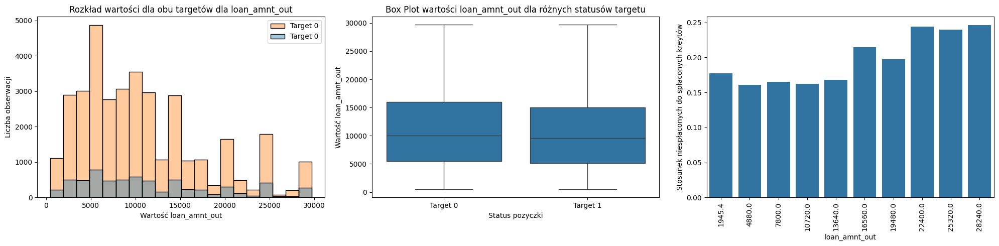

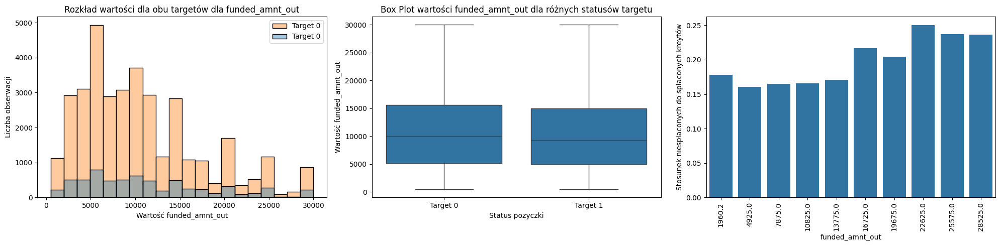

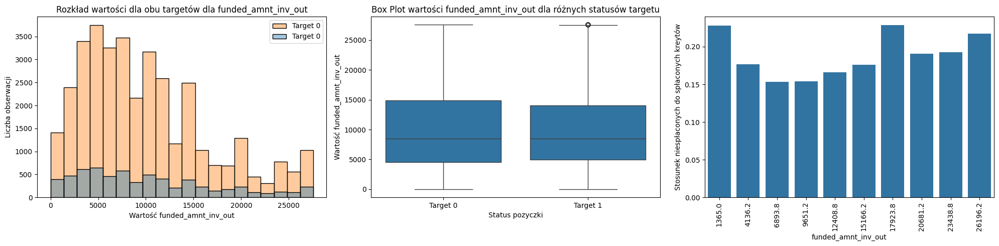

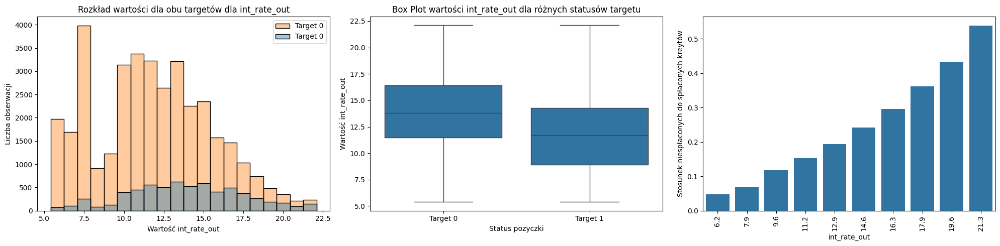

In [109]:
for col in columns_out_1:
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))
    sns.histplot(data=data, x=col, hue='loan_status', bins=20, kde=False, color='blue', alpha=0.4, ax=axs[0], label='Target 0')
    axs[0].set_title('Rozkład wartości dla obu targetów dla ' + col)
    axs[0].set_xlabel('Wartość ' + col)
    axs[0].set_ylabel('Liczba obserwacji')
    axs[0].legend()

    sns.boxplot(x='loan_status', y=col, data=data, ax=axs[1])
    axs[1].set_title('Box Plot wartości ' + col + ' dla różnych statusów targetu')
    axs[1].set_xlabel('Status pozyczki')
    axs[1].set_ylabel('Wartość ' + col)
    axs[1].set_xticks([0, 1])
    axs[1].set_xticklabels(['Target 0', 'Target 1'])

    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col, data, 10),  ax=axs[2])
    axs[2].set_xlabel(col)
    axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kreytów')
    axs[2].tick_params(axis='x', rotation=90)
    plt.tight_layout()
    plt.show()

#### <a name = '28'></a> 2.8 Transformacja Boxa-Coxa

In [110]:
columns_num = data.select_dtypes(include = 'number').columns.tolist()
columns_num

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'sub_grade',
 'annual_inc',
 'loan_status',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'emp_length_num',
 'grade_num',
 'fico_value',
 'term_numeric',
 'mths_since_last_delinq_new',
 'mths_since_last_record_new',
 'annual_inc_log',
 'loan_amnt_out',
 'funded_amnt_out',
 'funded_amnt_inv_out',
 'int_rate_out',
 'annual_inc_out']

In [111]:
col_bc_1 = ['installment',  'loan_amnt_out', 'funded_amnt_out',  'int_rate_out', 'annual_inc']

In [112]:
col_bc_2 = ['dti', 'delinq_2yrs','inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
         'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'pub_rec_bankruptcies','funded_amnt_inv_out']



Optimal lambda: 0.2601229251598919


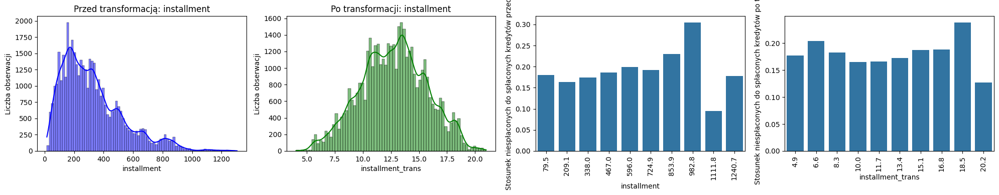

Optimal lambda: 0.2849131777157904


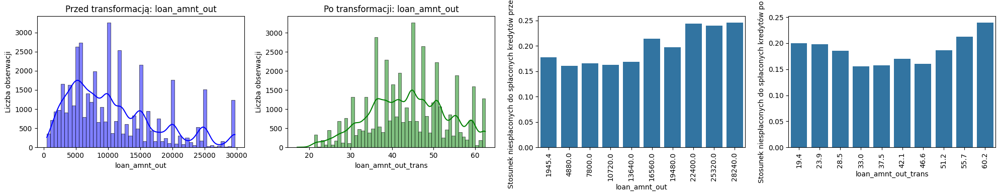

Optimal lambda: 0.28658324380831507


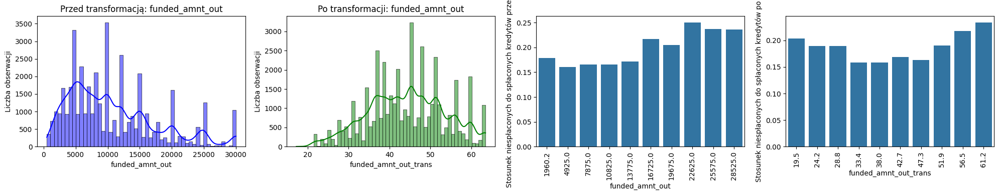

Optimal lambda: 0.5810703456359914


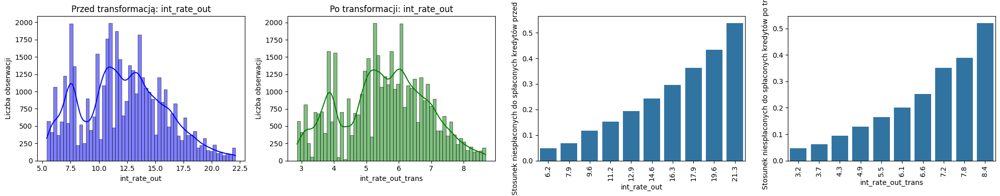

Optimal lambda: -0.038810241310667695


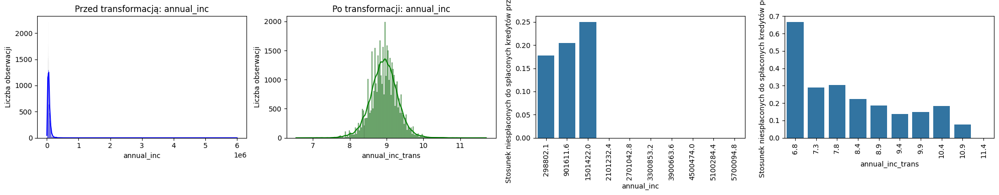

In [113]:
for col in col_bc_1:

    transformed_data, best_lambda = stats.boxcox(data[col])

    data[col+'_trans'] = transformed_data
    print(f"Optimal lambda: {best_lambda}")

    fig, axs = plt.subplots(1, 4, figsize=(20, 4))

    # Histogram przed transformacją
    sns.histplot(data[col], kde=True, ax=axs[0], color='blue')
    axs[0].set_title(f'Przed transformacją: {col}')
    axs[0].set_xlabel(col)
    axs[0].set_ylabel('Liczba obserwacji')

    # Histogram po transformacji
    sns.histplot(data[col + '_trans'], kde=True, ax=axs[1], color='green')
    axs[1].set_title(f'Po transformacji: {col}')
    axs[1].set_xlabel(col + '_trans')
    axs[1].set_ylabel('Liczba obserwacji')


    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col, data, 10),  ax=axs[2])
    axs[2].set_xlabel(col)
    axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kredytów przed trans')
    axs[2].tick_params(axis='x', rotation=90)
    plt.tight_layout()


    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col + '_trans', data, 10),  ax=axs[3])
    axs[3].set_xlabel(col + '_trans')
    axs[3].set_ylabel('Stosunek niespłaconych do spłaconych kredytów po trans')
    axs[3].tick_params(axis='x', rotation=90)
    plt.tight_layout()

    plt.tight_layout()
    plt.show()

Optimal lambda: 0.8252101249513335


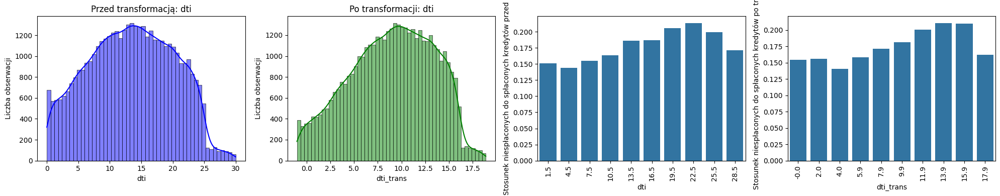

Optimal lambda: -3.454891042472048


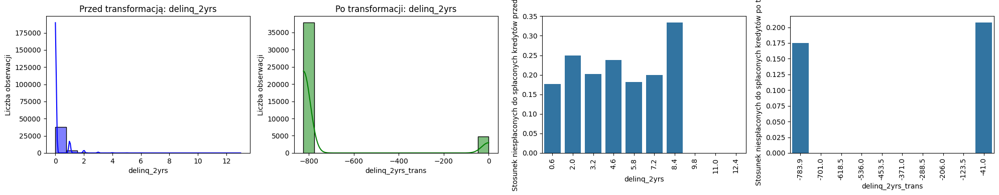

Optimal lambda: -0.05236845710802128


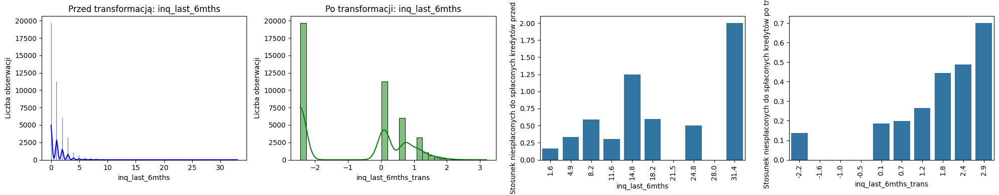

Optimal lambda: 0.6639464925378836


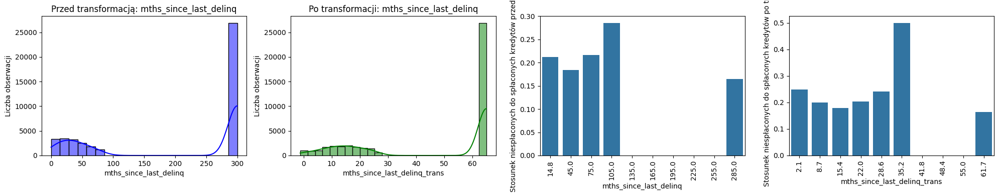

Optimal lambda: 3.0087927750022656


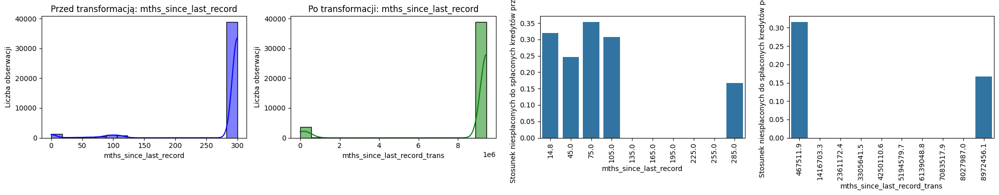

Optimal lambda: 0.2760086855742303


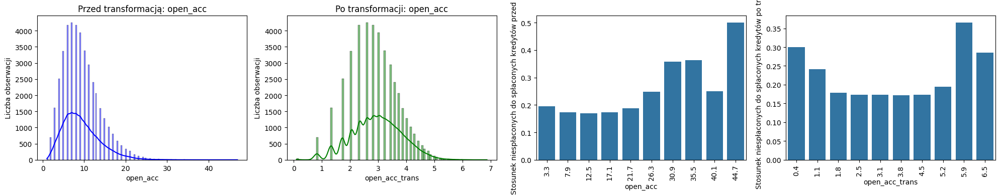

Optimal lambda: -7.391107226185493


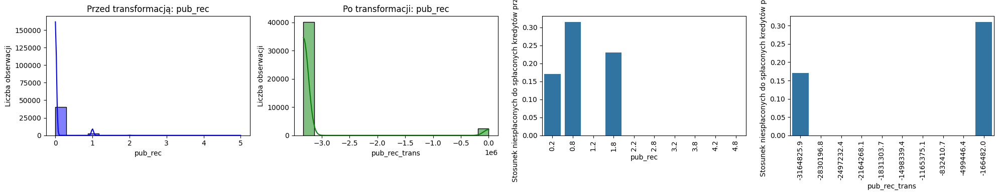

Optimal lambda: 0.2770619097506315


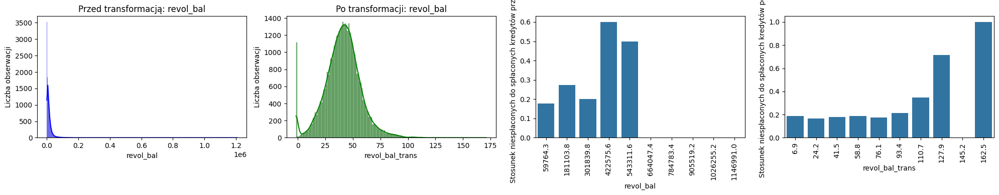

Optimal lambda: 0.7047649814494086


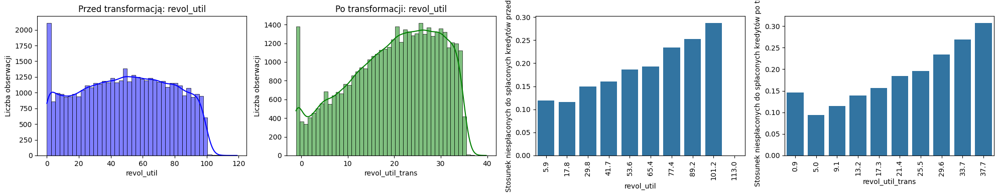

Optimal lambda: -6.690200546802102


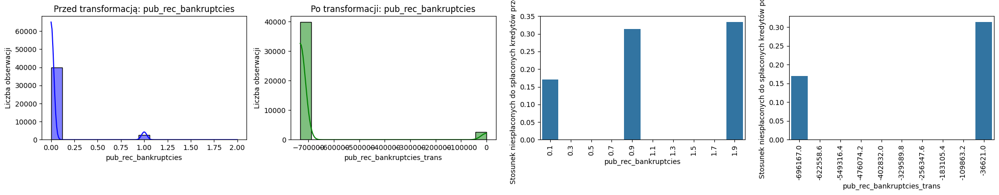

Optimal lambda: 0.4376633731536648


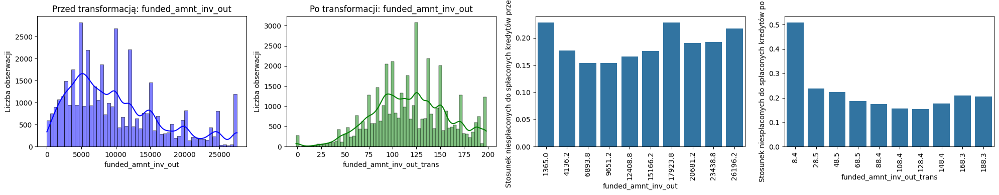

In [114]:
for col in col_bc_2:

    data[col+'_1'] = data[col] + 0.1
    transformed_data, best_lambda = stats.boxcox(data[col+'_1'])

    data[col+'_trans'] = transformed_data
    print(f"Optimal lambda: {best_lambda}")

    fig, axs = plt.subplots(1, 4, figsize=(20, 4))

    # Histogram przed transformacją
    sns.histplot(data[col], kde=True, ax=axs[0], color='blue')
    axs[0].set_title(f'Przed transformacją: {col}')
    axs[0].set_xlabel(col)
    axs[0].set_ylabel('Liczba obserwacji')

    # Histogram po transformacji
    sns.histplot(data[col + '_trans'], kde=True, ax=axs[1], color='green')
    axs[1].set_title(f'Po transformacji: {col}')
    axs[1].set_xlabel(col + '_trans')
    axs[1].set_ylabel('Liczba obserwacji')


    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col, data, 10),  ax=axs[2])
    axs[2].set_xlabel(col)
    axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kredytów przed trans')
    axs[2].tick_params(axis='x', rotation=90)
    plt.tight_layout()


    sns.barplot(x='bin_center', y='ratio', data=ratio_0_1_num(col + '_trans', data, 10),  ax=axs[3])
    axs[3].set_xlabel(col + '_trans')
    axs[3].set_ylabel('Stosunek niespłaconych do spłaconych kredytów po trans')
    axs[3].tick_params(axis='x', rotation=90)
    plt.tight_layout()

    plt.tight_layout()
    plt.show()
    data.drop(columns = [col+'_1'], inplace = True)

In [115]:
new = data[['installment_trans',
       'inq_last_6mths_trans', 'revol_bal_trans', 'loan_amnt_out_trans',
       'funded_amnt_out_trans', 'int_rate_out_trans', 'annual_inc_trans',
       'dti_trans', 'delinq_2yrs_trans', 'mths_since_last_delinq_trans',
       'mths_since_last_record_trans', 'open_acc_trans', 'pub_rec_trans',
       'revol_util_trans', 'pub_rec_bankruptcies_trans',
       'funded_amnt_inv_out_trans', 'loan_status']]

In [116]:
new.corr()['loan_status']

,loan_status
installment_trans,-0.015742
inq_last_6mths_trans,-0.095159
revol_bal_trans,-0.010373
loan_amnt_out_trans,-0.033057
funded_amnt_out_trans,-0.030741
int_rate_out_trans,-0.199002
annual_inc_trans,0.066803
dti_trans,-0.041942
delinq_2yrs_trans,-0.020248
mths_since_last_delinq_trans,0.037656


*Podsumowanie transformacji Boxa-Coxa:  
Jedynie w przypadku zmiennych installment, revol_bal i inq_last_6_mths stwierdzono poprawę rozkładu bez zmiany 0_1_ratio zależność ze zmianą zmiennej oraz z korzystną zminą w przypadku inq_last_6_mths i revol_bal
Do modelowania pozostawione zostną tylko te zmienne.*

In [117]:
col = ['loan_amnt_out_trans', 'funded_amnt_out_trans','int_rate_out_trans', 'dti_trans', 'delinq_2yrs_trans',
        'mths_since_last_delinq_trans','mths_since_last_record_trans', 'open_acc_trans', 'pub_rec_trans',
       'revol_util_trans', 'pub_rec_bankruptcies_trans']

In [118]:
data = data.drop(columns = col, axis = 1)

In [119]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'desc',
       'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'emp_length_num',
       'grade_num', 'fico_value', 'fico_category', 'term_numeric',
       'mths_since_last_delinq_new', 'mths_since_last_record_new',
       'annual_inc_log', 'annual_inc_cat', 'earliest_cr_line_Y',
       'loan_amnt_out', 'funded_amnt_out', 'funded_amnt_inv_out',
       'int_rate_out', 'annual_inc_out', 'installment_trans',
       'annual_inc_trans', 'inq_last_6mths_trans', 'revol_bal_trans',
       'funded_amnt_inv_out_trans'],
      dtype='object')

#### <a name = '29'></a> 2.9 Binaryzacja danych

In [120]:
col = ['emp_length', 'pub_rec', 'pub_rec_bankruptcies']

In [121]:
data['pub_rec'].value_counts()

,count
pub_rec,
0.0,40155
1.0,2298
2.0,64
3.0,11
4.0,2
5.0,1


In [122]:
data['emp_length_bin']= data['emp_length'].apply(lambda x: 0 if x=='brak' else 1)

In [123]:
data['pub_rec_bin']= data['emp_length'].apply(lambda x: 0 if x==0 else 1)

In [124]:
data['pub_rec_bankruptcies_bin']= data['emp_length'].apply(lambda x: 0 if x==0 else 1)

#### <a name = '210'></a> 2.10 Zmienna kategoryczna 'mths_since_last_delinq_cat

In [125]:
data['mths_since_last_delinq_cat'] = data['mths_since_last_delinq'].apply(lambda x: '<24' if x <=24 else('>24' if  x<300  else 'brak'))

In [126]:
data[['mths_since_last_delinq','mths_since_last_delinq_cat']].head(10)

,mths_since_last_delinq,mths_since_last_delinq_cat
0,300.0,brak
1,300.0,brak
2,300.0,brak
3,35.0,>24
4,38.0,>24
5,300.0,brak
6,300.0,brak
7,300.0,brak
8,300.0,brak
9,300.0,brak


<Axes: xlabel='mths_since_last_delinq_cat', ylabel='ratio'>

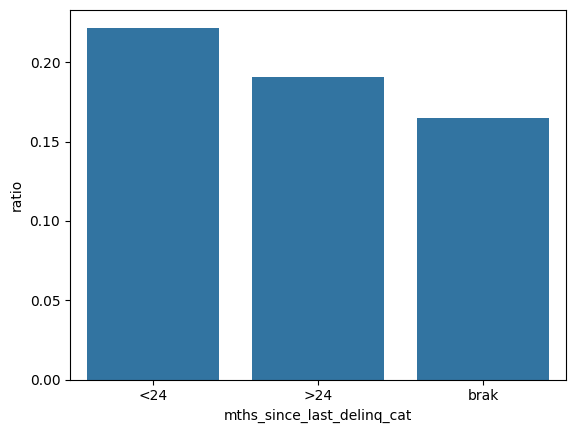

In [127]:
sns.barplot(x='mths_since_last_delinq_cat', y='ratio', data=ratio_0_1('mths_since_last_delinq_cat', data))

In [128]:
#Zmienna lepiej skorelowana z targetem dlatego zmienna mths_since_last_delinq_ będzie usunięta
data.drop(columns = 'mths_since_last_delinq_new', axis = 1, inplace = True)

#### <a name = '211'></a> 2.11 Podsumowanie

Na podstawie przeprowadzonej analizy stwierdzono korelacje pomiędzy spłacalnościa kredytu a wartościa dla zmiennych:  
'loan_amnt', 'term', 'int_rate','grade', pub_rec, 'revol_util', fico, i ewentualnie do sprawdzenia 'zip_code'.
Dla zmiennych , revol_bal_trans, 'annual_inc_cat', 'mths_since_last_record_new', 'funded_amnt_inv_out_trans', 'inq_last_6mths_trans','annual_inc_trans'taka korelacja została stwierdzona po transformacji danych wyjściowych.

 #### <a name = '3'></a> 3 Inżynieria danych - nowe zmienne

Część nowych zmiennych została utworzona już na etapie analizy danych w momencie zauważenia takiej konieczności.

skrót 0_1_ratio - stosunek ilosci niespłaconych do spłaconych kredytów

In [129]:
lista_new= []

In [130]:
def figure(col, data, a):
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    sns.histplot(data=data, x=col, hue='loan_status', bins=20, kde=False, color='blue', alpha=0.4, ax=axs[0])
    axs[0].set_title(f'Rozkład wartości dla {col}')
    axs[0].set_ylabel('Liczba obserwacji')
    axs[0].legend(title="Status pozyczki")

    sns.boxplot(x='loan_status', y=col, data=data, ax=axs[1])
    axs[1].set_title('Box Plot')
    axs[1].set_xlabel('Status pozyczki')
    axs[1].set_xticks([0, 1])
    axs[1].set_xticklabels(['Target 0', 'Target 1'])

    barplot_data = ratio_0_1_num(col, data, a)  # Zakładamy, że funkcja ratio_0_1_num działa poprawnie
    sns.barplot(x='bin_center', y='ratio', data=barplot_data, ax=axs[2])
    axs[2].set_ylabel('Stosunek niespłaconych do spłaconych kredytów')
    axs[2].set_xlabel('Środek binów')
    axs[2].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.close(fig)

    return fig


#### <a name = '31'></a> 3.1 Zmienna "funded_to loan_amnt"

Stosunek wnioskowanej kwoty pożyczki do przyznanej. Wskazuje na poziom zaufania inwestorów do pożyczkobiorcy.

In [131]:
data['funded_to_loan_amnt_ratio'] = data['funded_amnt']/data['loan_amnt']

In [132]:
data['funded_to_loan_amnt_ratio'].value_counts().sort_values(ascending=False).head()

,count
funded_to_loan_amnt_ratio,
1.000,40534
0.625,24
0.700,14
0.610,12
0.675,11


In [133]:
data[data['funded_to_loan_amnt_ratio']<1].shape

(1997, 55)

In [134]:
#Stosunek niespłaconych do spłaconych
data[(data['funded_to_loan_amnt_ratio']==1)&(data['loan_status']==0)].shape[0]/data[(data['funded_to_loan_amnt_ratio']==1) &(data['loan_status']==1)].shape[0]

0.17588697745931361

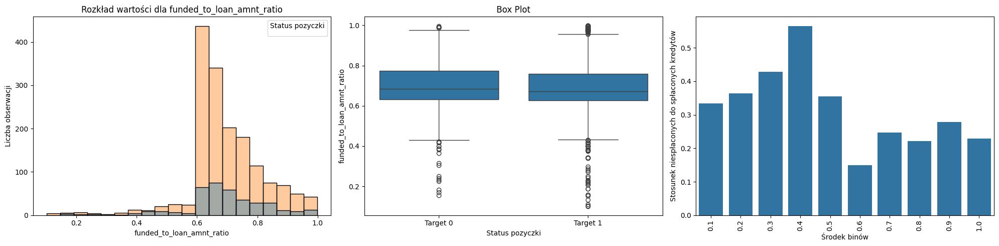

In [135]:
figure('funded_to_loan_amnt_ratio', data[data['funded_to_loan_amnt_ratio']<1], 10)


*W przypadku kiedy przyznana kwota kredytu była inna niż kwota wnioskowana rozkdład wartości dla zmiennej 'funded_to loan_amnt'  w zalezności od wartości predykcji nie wykazuje istotnych róznic. Zakres wartosci, mediana i rozstępy kwartylowe były prawie takie same. W przypadku kredytów spłaconych zaobserowano więcej wartosci odstających zarówno powyżej górnych jak i poniej dolnych wąsów.Jednak widać róznice w stosunku niespłaconych do spłaconych kredytów którey dla tej grupy jest wiekszy od przeciętnej - 0.18*

In [136]:
lista_new.append('funded_to_loan_amnt_ratio')

#### <a name = '32'></a> 3.2 Zmienna "age_of_credit_line"

Jak długo pożyczkobiorca korzystał z produktów kredytowych przed uzyskaniem danej pożyczki.

In [137]:
data[['issue_d', 'earliest_cr_line']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42531 entries, 0 to 42530
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   issue_d           42531 non-null  datetime64[ns]
 1   earliest_cr_line  42531 non-null  datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 664.7 KB


In [138]:
data['issue_d'] = pd.to_datetime(data['issue_d'])
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])
#data['issue_d'] = data['issue_d'].dt.to_timestamp()

In [139]:
#data['issue_d'] = data['issue_d'].dt.to_timestamp()
#data['earliest_cr_line'] = data['earliest_cr_line'].dt.to_timestamp()

In [140]:
data['age_of_credit_lin'] = round(((data['issue_d'] - data['earliest_cr_line']).dt.days/365.25), 1)

In [141]:
data[['age_of_credit_lin', 'loan_status']].head()


,age_of_credit_lin,loan_status
0,26.9,1
1,12.7,0
2,10.1,1
3,15.8,1
4,15.9,1


In [142]:
print(data['age_of_credit_lin'].max())
print(data['age_of_credit_lin'].min())

65.4
0.5


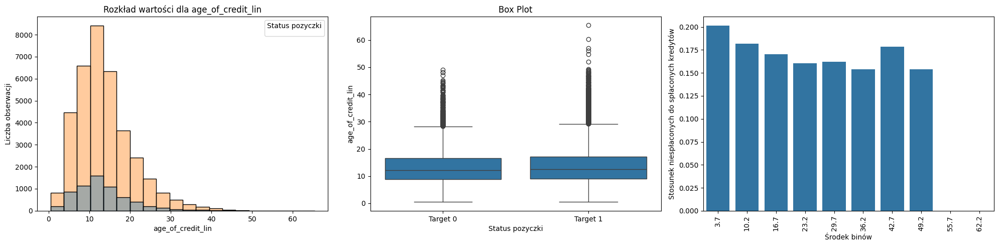

In [143]:
figure('age_of_credit_lin', data, 10)

*Rozkład wartości nowej zmiennej w stosunku do predykcji spłaty lub nie kredytu jest bardzo zbliżony, nie widać istotnych różnic w zakresie danych, rozstępach międzykwartylowaych czy miedianie. Jedynie dla predykcji 1 zaobserwować można więcej wartości odstających. Ze wzrostem wartosci 'age_of_credit_lin' widać niewielką tendencję spadkową stosunku 0_1_ratio, poza wartością bin około 43 dla tej zmiennej.*

In [144]:
# Korelacja ze spłata kredytu - słaba
data['age_of_credit_lin'].corr(data['loan_status'])

0.021970125527369527

In [145]:
lista_new.append('age_of_credit_lin')

#### <a name = '33'></a> 3.3 Zmienna "funded_income_ratio"

Stosunek kwoty pożyczki do rocznych dochodów pożyczkobiorcy

In [146]:

data['funded_income_ratio'] = data['funded_amnt']/data['annual_inc_out']

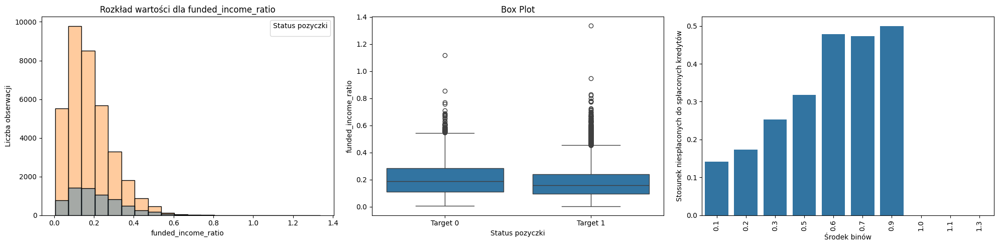

In [147]:
figure('funded_income_ratio', data, 10)

*Widoczne są różnice w rozkładzie wartości zmiennej 'funded_income_ratio'w zależności od wartości predykcji. Zakres maksymalnych wartości, mediana i rozstęp interkwartylowy jest większy dla predykcji niespłaty kredytu co wskazuje że kredyty wyższe w stosunku do dochodu były trudniejsze do spłacenia. Rownież wartość 0_1_ratio wzrastała ze wzrostem wartości tej zmiennej*

In [148]:
# Korelacja ze spłata kredytu - słaba
data['funded_income_ratio'].corr(data['loan_status'])

-0.09640496692535441

In [149]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['funded_income_ratio']


In [150]:
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,funded_income_ratio
funded_income_ratio,1.000000
funded_amnt_out,0.620904
funded_amnt,0.616158
installment_trans,0.607370
loan_amnt_out,0.602887
loan_amnt,0.596630
funded_amnt_inv_out,0.587633
funded_amnt_inv,0.581866
funded_amnt_inv_out_trans,0.577259
installment,0.573137


*Zmienna jest dość dobrze skorelowana z pozostałymi zmiennymi związanymi z wysokością kredytu, z wysokościa raty kredytowej, ale również z długoącia kredytu, oprocentowanie i słabo ze zmienną grade*

In [151]:
lista_new.append('funded_income_ratio')

#### <a name = '34'></a> 3.4 Zmienna "funded_inv_to_tot_ratio"

Stosunek kwoty zainwestowanej do całkowitej kwoty kredytu.

In [152]:
data['funded_inv_to_tot_ratio'] = data['funded_amnt_inv']/data['funded_amnt']

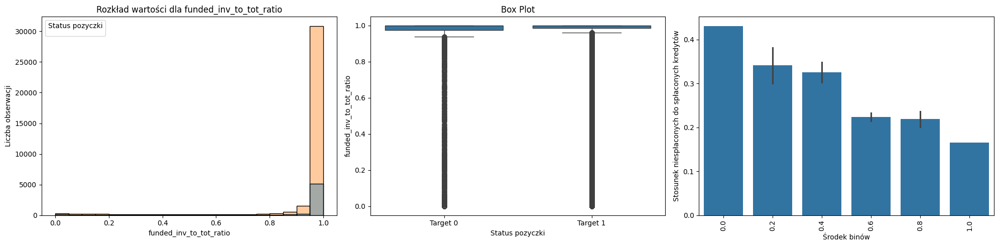

In [153]:
figure('funded_inv_to_tot_ratio', data, 10)

*Ze wzrostem zmiennej czyli ze wzrostem udziału zainwestowanej części w kredycie spadała wartość 0_1_ratio. Widać również zmianę w rozkładzie wartości zmiennej w stosunku do spłaconych i niespłaconych kredytów. Dla kredytów niespłaconych zakres i rozstęp interwartylowy wartosci był szerwszy niż dla spłaconych*

In [154]:
data['funded_inv_to_tot_ratio'].corr(data['loan_status'])


0.08014564573383767

In [155]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['funded_inv_to_tot_ratio']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,funded_inv_to_tot_ratio
funded_inv_to_tot_ratio,1.000000
funded_amnt_inv_out_trans,0.414765
mths_since_last_record,0.410390
funded_amnt_inv_out,0.290456
funded_amnt_inv,0.281067
mths_since_last_delinq,0.165834
term_numeric,0.146802
funded_to_loan_amnt_ratio,0.114745
fico_value,0.108598
inq_last_6mths_trans,-0.104885


*Macierz korelacji wskazuje ze zmienna słabo koreluje się z targetem, jest skorelowana ze zmienną wskazująca na ilość miesięcy od ostatniego wpisu w rejestrach*

In [156]:
lista_new.append('funded_inv_to_tot_ratio')

#### <a name = '35'></a> 3.5 Zmienna "mth_inncom" dochód miesięczny

In [157]:
data['mth_inc'] = data['annual_inc_out']/12

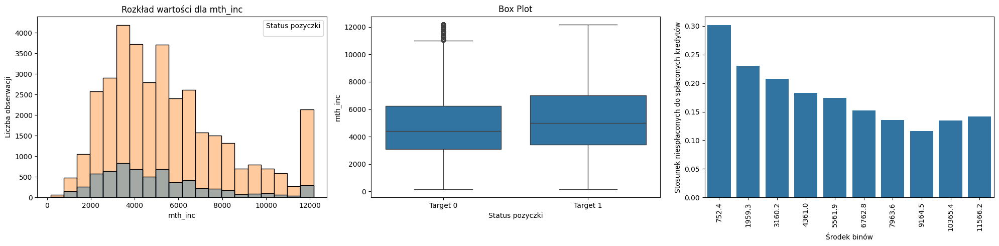

In [158]:
figure('mth_inc', data, 10)

*Widać róznicę w rozkładzie wartości dla zmiennej w zależności od spłacalności pozyczki. Pożyczki spłacone posiadały wyższą wartość mediany i górnego zakresu. Podobnie jak dla dochodu rocznego widać spadek wartości 0_1_ratio ze wzrostem dochodu.*

In [159]:
data['mth_inc'].corr(data['loan_status'])

0.06396791591162575

In [160]:

col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['mth_inc']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,mth_inc
annual_inc_out,1.000000
mth_inc,1.000000
annual_inc_log,0.952556
annual_inc_trans,0.949583
annual_inc,0.664139
loan_amnt,0.437912
installment,0.437529
loan_amnt_out,0.437510
funded_amnt_out,0.433390
funded_amnt,0.433293


*Poza zmiennymi związanymi z dochodem, co jest oczywiste, zmienna koreluje się ze zmienną revol_bal, wysokościa raty kredytowej i ilością kont*

In [161]:
lista_new.append('mth_inc')

#### <a name = '36'></a> 3.6 Zmienna "mth_install_to_incom"

 Stosunek miesięcznego  raty do dochodu Im wieksza wartość tym rata kredytu jest wyższa w stosunku do dochodu, stanowi wieksze obciążenie budżetu dodmowego.

In [162]:
data['mth_install_to_incom'] = data['installment']/data['mth_inc']

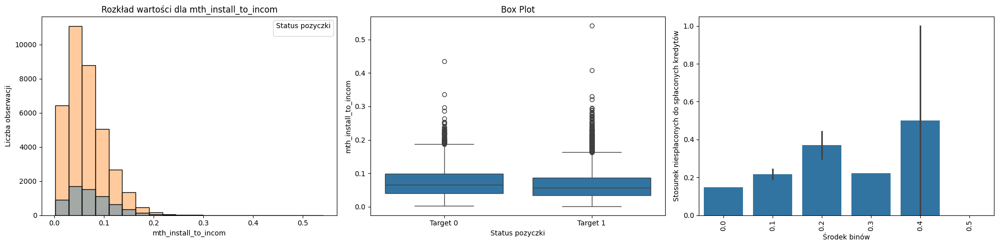

In [163]:
figure('mth_install_to_incom', data, 10)

In [164]:
data[data['mth_install_to_incom']>0.2].shape

(212, 60)

In [165]:
data['mth_install_to_incom'].corr(data['loan_status'])

-0.07596383405180382

In [166]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['mth_install_to_incom']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,mth_install_to_incom
mth_install_to_incom,1.000000
funded_income_ratio,0.953118
installment_trans,0.618551
installment,0.592078
funded_amnt_out,0.560276
funded_amnt,0.554403
loan_amnt_out,0.536561
loan_amnt,0.528831
funded_amnt_inv_out,0.514110
funded_amnt_inv_out_trans,0.508921


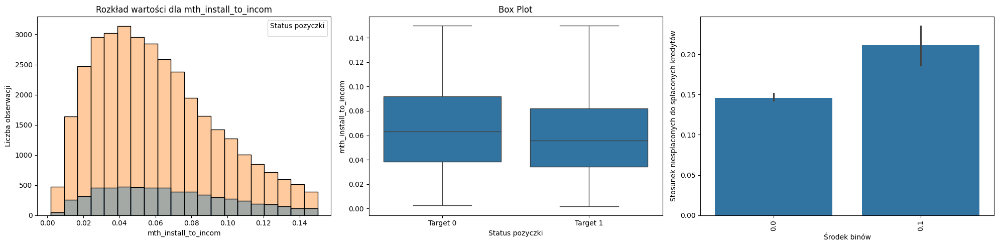

In [167]:
#Rozkład dla klientów w zakresie 'mth_install_to_incom' < 0.15
figure('mth_install_to_incom', data[data['mth_install_to_incom']<0.15], 10)

In [168]:
data[data['mth_install_to_incom']<0.15].shape

(40897, 60)

In [169]:
lista_new.append('mth_install_to_incom')

*Mediana i zakres wartości dla predykcji 0 jest nieznacznie większy niż dla predykcji 1. Widać wzrost wartości 0_1_ratio ze wzrostem wartości zmiennej, ale liczba takich klientow jest niewielka. Dla wartości zmiennej > 0.2 jest 212 klientów. Dla zdecydowanej większości klientów nie widać znaczącej różnicy wartości 0_1_ratio a wartość zmiennej 'mth_install_to_incom' mieści się w przedziale 0 - 0.15*

#### <a name = '37'></a> 3.7 Zmienna "acc_hist"

Stosunek aktualnej do całkowitej ilości kont -  pokazuje aktywność kredytobiorcy. Im wartośc mniejsza od 1  tym więcej kont w historii kredytowej

In [170]:
data['acc_hist'] = data['open_acc']/data['total_acc']

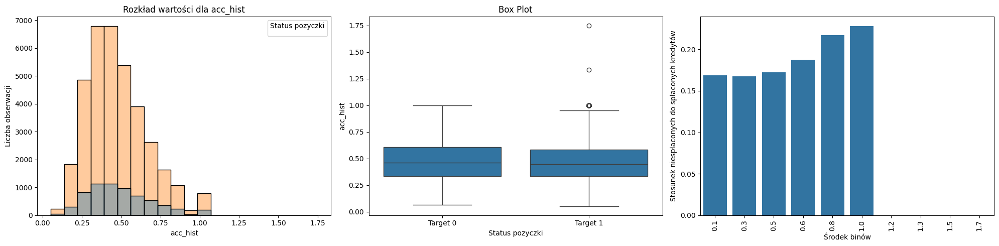

In [171]:
figure('acc_hist', data, 10)

In [172]:
data[data['acc_hist']>0.6].shape

(9520, 61)

In [173]:
data['acc_hist'].corr(data['loan_status'])

-0.028325794910825087

In [174]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['acc_hist']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,acc_hist
acc_hist,1.000000
mths_since_last_delinq,0.129543
open_acc,0.121667
installment_trans,-0.146489
installment,-0.146722
annual_inc,-0.152811
funded_amnt,-0.171293
funded_amnt_out,-0.172095
loan_amnt,-0.175772
loan_amnt_out,-0.176632


*Zmienna nie koreluje się z predykcją ani z inną zmienną z którą jest logicznie niezależna. Widoczny niewielki spadek wartości 0_1_ratio ze wzrostem ilości kąt w historii kredytowej*

In [175]:
lista_new.append('acc_hist')

#### <a name = '38'></a> 3.8 Zmienna "pub_rec_type"

Zmienna kategoryczna klasyfikujaca zgłoszenia publiczna na związane z upadłością - rec_with_bank, nie zwiazane z upadłością  - rec_without_bank i brak zgłoszenia - rec_lack

In [176]:
data['pub_rec_type'] = data.apply(lambda x: 'rec_with_bankr' if (x['pub_rec'] != 0) and (x['pub_rec_bankruptcies'] != 0) else ('rec_without_bankr' if (x['pub_rec'] != 0) and (x['pub_rec_bankruptcies'] == 0) else 'rec_lack'), axis=1)


In [177]:
data['pub_rec_type'].value_counts()


,count
pub_rec_type,
rec_lack,40155
rec_with_bankr,1869
rec_without_bankr,507


<Axes: xlabel='ratio', ylabel='pub_rec_type'>

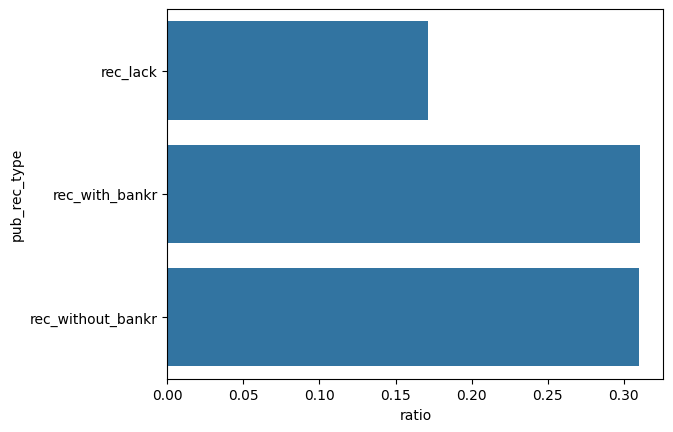

In [178]:
sns.barplot(data=ratio_0_1('pub_rec_type', data), x='ratio', y = 'pub_rec_type')

*Wszystkie przypadke zgłoszenia posiadały wartość 0_1_ratio wyższy - 0,3 niż przeciętny dla zbioru 0,17.*

#### <a name = '39'></a> 3.9  Zmienna "other_debt"

Inne zobowiązania finansowe kredytobiorcy.

In [179]:
data['other_debt'] = (data['dti']*data['mth_inc'])-data['installment']

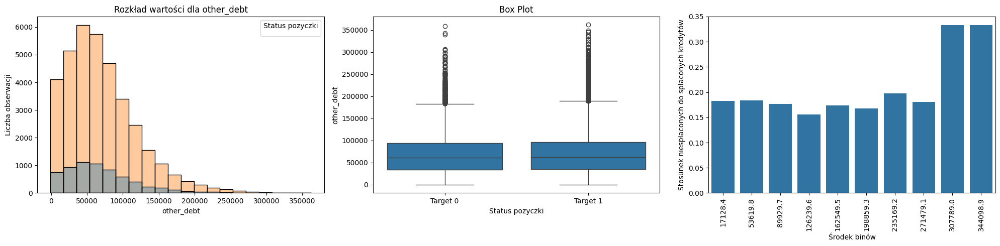

In [180]:
figure('other_debt', data, 10)


In [181]:
data['other_debt'].corr(data['loan_status'])

0.008859325928941912

*Nie koreluje się z targetem, nie widac istotnej zmienności 0_1_ratio ze zmienną*

In [182]:
lista_new.append('other_debt')

#### <a name = '310'></a> 3.10 Zmienna 'mnt_debt_installment'

Stosunek wysokości miesięcznych zobowiązań do wysokości raty kredytowej

In [183]:
data['mth_debt_installment'] = data['other_debt']/data['installment']

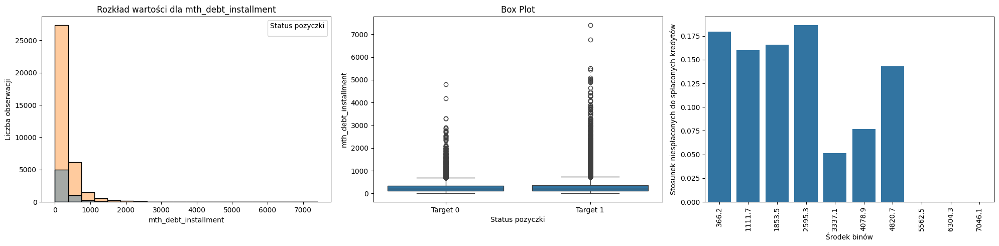

In [184]:
figure('mth_debt_installment', data, 10)

In [185]:
lista_new.append('mth_debt_installment')

*Nie widać korelacji zmiennej ze spłacalnością kredytu*

#### <a name = '311'></a> 3.11 Zmienna "fico_int_rate"

FICO (fico_value) do oprocentowania pożyczki (int_rate). Może pokazać, czy osoby z niższym wynikiem FICO faktycznie ponoszą wyższe koszty finansowe.

In [186]:
data['fico_int_rate'] = data['fico_value']/data['int_rate']


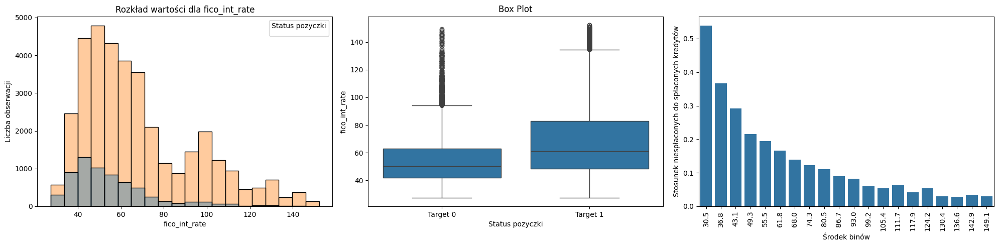

In [187]:
figure('fico_int_rate', data, 20)

In [188]:
data[data['fico_int_rate'] <49].shape

(12512, 65)

In [189]:
data['fico_int_rate'].corr(data['loan_status'])


0.18237984608167732

In [190]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['fico_int_rate']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,fico_int_rate
fico_int_rate,1.000000
fico_value,0.766653
mths_since_last_delinq,0.264958
loan_status,0.182380
age_of_credit_lin,0.159627
mths_since_last_record,0.103284
acc_hist,-0.112012
mths_since_last_record_new,-0.112930
pub_rec,-0.114965
revol_bal_trans,-0.125217


In [191]:
lista_new.append('fico_int_rate')

*Zmienna wykazuje różnice w rozkładzie w stosunku do predykcji 0 i 1. Dla kredytów niespłaconych zakres wartości i mediana były wyższe. Istnieje niewielka korelacja z predykcją. Ze wzrostem zmiennej spada wartosć 0_1_ratio*

#### <a name = '312'></a> 3.12  Zmienna 'funded_amnt_fico'

Stosunek kwoty kredytu do wskaźnika fico

In [192]:
data['funded_amnt_fico'] = data['funded_amnt']/data['fico_value']

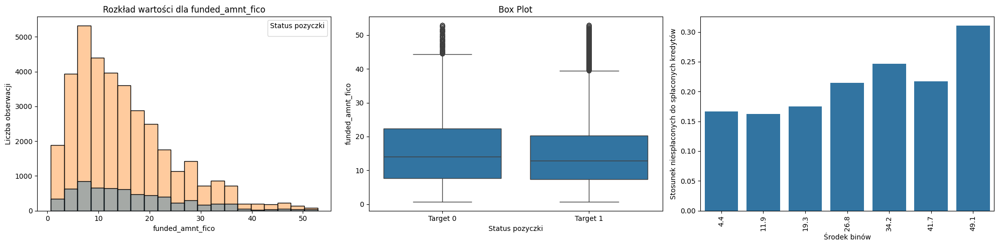

In [193]:
figure('funded_amnt_fico', data, 7)

In [194]:
data[data['funded_amnt_fico'] >28].shape

(5030, 66)

In [195]:
data['funded_amnt_fico'].corr(data['loan_status'])

-0.05040338225866505

In [196]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['funded_amnt_fico']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,funded_amnt_fico
funded_amnt_fico,1.000000
funded_amnt,0.996128
funded_amnt_out,0.993540
loan_amnt,0.977191
loan_amnt_out,0.974743
installment,0.959238
funded_amnt_inv,0.941404
funded_amnt_inv_out,0.934181
installment_trans,0.927486
funded_amnt_inv_out_trans,0.871422


In [197]:
lista_new.append('funded_amnt_fico')

*Ze wzrostem zmiennej nastepuje wzrost wartości 0_1_ratio. Zakres wartości zmiennej i mediana dla predykcji 0 jest nieznacznie większy niż dla predykcji 1.*

#### <a name = '313'></a> 3.13 Zmienna "dti_ratio_per_grade"

Obliczenie średniej DTI dla każdej kategorii kredytowej (grade).

In [198]:
mean_grade = round(data.groupby('grade')['dti'].mean(), 2)

In [199]:
mean_grade_dict = mean_grade.to_dict()

In [200]:
mean_grade_dict

{'A': 12.05,
 'B': 13.39,
 'C': 13.85,
 'D': 13.97,
 'E': 14.18,
 'F': 14.64,
 'G': 15.69}

In [201]:
data['dti_ratio_per_grade'] = data['grade'].map(mean_grade_dict)

In [202]:
data[['dti_ratio_per_grade','grade']].head()

,dti_ratio_per_grade,grade
0,13.39,B
1,13.85,C
2,13.85,C
3,13.85,C
4,13.39,B


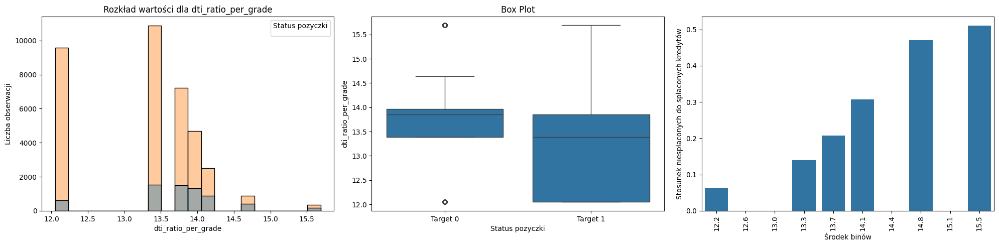

In [203]:
figure('dti_ratio_per_grade', data, 10)

In [204]:
data['dti_ratio_per_grade'].corr(data['loan_status'])

-0.18734346598698504

In [205]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['dti_ratio_per_grade']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,dti_ratio_per_grade
dti_ratio_per_grade,1.000000
int_rate,0.908735
int_rate_out,0.908671
grade_num,0.900870
sub_grade,0.893733
revol_util,0.441402
term_numeric,0.349500
funded_amnt_fico,0.292384
funded_amnt_out,0.243024
funded_amnt,0.241793


In [206]:
lista_new.append('dti_ratio_per_grade')

*Widać wyraźną róznicę w rozkładzie danych dla predykcji 0 i 1. Zakres wartosci dla targetu 0 był mniejszy a mediana wyzsza niz dla targetu 1. Ze wzrostem wartosci zmiennej wzrastała wartośc 0_1_ratio. Zmienna koreluje sie z targetem i innymi zmiennymi.*

#### <a name = '314'></a> 3.14 Zmienna "dti_ratio_per_purpose"

Obliczenie średniej DTI dla każdej kategorii celu pozyczki.

In [207]:
mean_purpose = round(data.groupby('purpose')['dti'].mean(), 2)

In [208]:
mean_purpose_dict = mean_purpose.to_dict()

In [209]:
mean_purpose_dict

{'car': 11.11,
 'credit_card': 14.67,
 'debt_consolidation': 14.55,
 'educational': 11.24,
 'home_improvement': 11.28,
 'house': 10.59,
 'major_purchase': 10.86,
 'medical': 12.42,
 'moving': 11.69,
 'other': 12.37,
 'renewable_energy': 12.01,
 'small_business': 11.24,
 'vacation': 12.2,
 'wedding': 12.34}

In [210]:
data['dti_ratio_per_purpose'] = data['purpose'].map(mean_purpose_dict)

In [211]:
data[['dti_ratio_per_purpose', 'purpose']].head()

,dti_ratio_per_purpose,purpose
0,14.67,credit_card
1,11.11,car
2,11.24,small_business
3,12.37,other
4,12.37,other


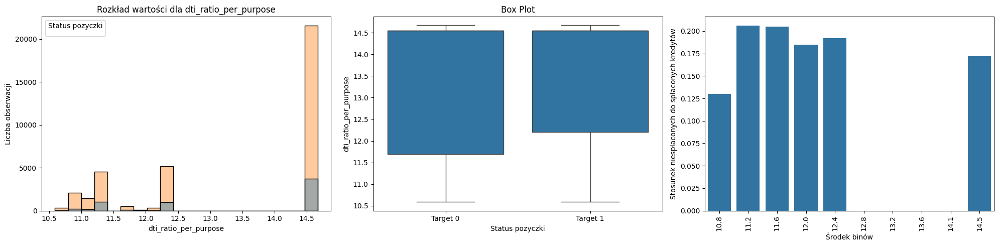

In [212]:
figure('dti_ratio_per_purpose', data, 10)

In [213]:
data['dti_ratio_per_purpose'].corr(data['loan_status'])

0.012787549109089852

In [214]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['dti_ratio_per_purpose']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,dti_ratio_per_purpose
dti_ratio_per_purpose,1.000000
revol_util,0.259055
revol_bal_trans,0.250434
installment_trans,0.228141
dti,0.224186
funded_amnt_inv_out_trans,0.202542
mth_install_to_incom,0.198132
funded_amnt_fico,0.196699
installment,0.193452
funded_amnt_inv_out,0.192028


In [215]:
lista_new.append('dti_ratio_per_purpose')

*Zmienna nie wykazuje istotnych różnic w rozkładzia poza zakresem interkwartylowym, nie widaż zalezności pomiędzy wartością zmiennej a wartoscią ratio_0_1_ratio.*

#### <a name = '315'></a> 3.15 Zmienna "mean_funded_addr"

Średnia kwota pozyczki dla kazdego stanu

In [216]:
mean_addr = (data.groupby('addr_state')['funded_amnt'].mean()).astype(int)

In [217]:
mean_addr_dict = mean_addr.to_dict()

In [218]:
mean_addr_dict

{'AK': 12677,
 'AL': 10913,
 'AR': 10073,
 'AZ': 10600,
 'CA': 11007,
 'CO': 10939,
 'CT': 11075,
 'DC': 11929,
 'DE': 9995,
 'FL': 10287,
 'GA': 10900,
 'HI': 10700,
 'IA': 8239,
 'ID': 8038,
 'IL': 11148,
 'IN': 7027,
 'KS': 10498,
 'KY': 10703,
 'LA': 10122,
 'MA': 11021,
 'MD': 11108,
 'ME': 3066,
 'MI': 10697,
 'MN': 10047,
 'MO': 10168,
 'MS': 7061,
 'MT': 10236,
 'NC': 10948,
 'NE': 8086,
 'NH': 11314,
 'NJ': 11285,
 'NM': 9970,
 'NV': 10527,
 'NY': 10904,
 'OH': 10511,
 'OK': 11015,
 'OR': 10248,
 'PA': 10285,
 'RI': 9180,
 'SC': 10600,
 'SD': 9563,
 'TN': 6884,
 'TX': 11266,
 'UT': 10827,
 'VA': 11266,
 'VT': 8759,
 'WA': 10718,
 'WI': 10851,
 'WV': 10598,
 'WY': 10952}

In [219]:
data['mean_funded_addr_state'] = data['addr_state'].map(mean_addr_dict)

In [220]:
data['mean_funded_addr_state'].shape

(42531,)

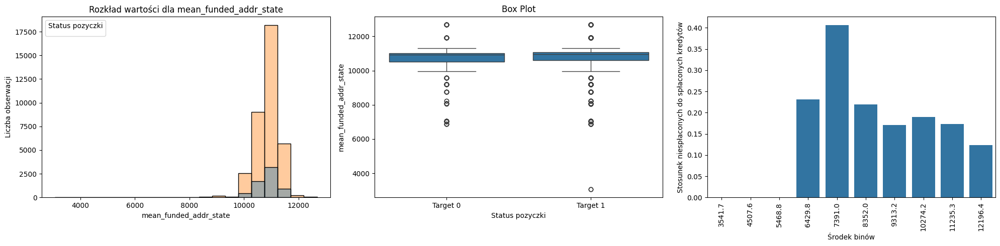

In [221]:
figure('mean_funded_addr_state', data, 10)

In [222]:
data['mean_funded_addr_state'].corr(data['loan_status'])


0.01928210666614765

In [223]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['mean_funded_addr_state']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,mean_funded_addr_state
mean_funded_addr_state,1.000000
mth_inc,0.102696
annual_inc_out,0.102696
annual_inc_trans,0.101872
annual_inc_log,0.101722


In [224]:
lista_new.append('mean_funded_addr_state')

*Nie widać zasadniczych rznic w rozkładzie zmiennej dla targetu 0 i 1, jednak widać zależność wartości 0_1_ratio od wartości zmiennej.*

#### <a name = '316'></a> 3.16 Zmienna "mean_ann_inc_adrr"

Średni dochód roczny dla stanu

In [225]:
mean_addr = (data.groupby('addr_state')['annual_inc_out'].mean()).astype(int)


In [226]:
mean_addr_dict = mean_addr.to_dict()
data['mean_annu_addr_state'] = data['addr_state'].map(mean_addr_dict)

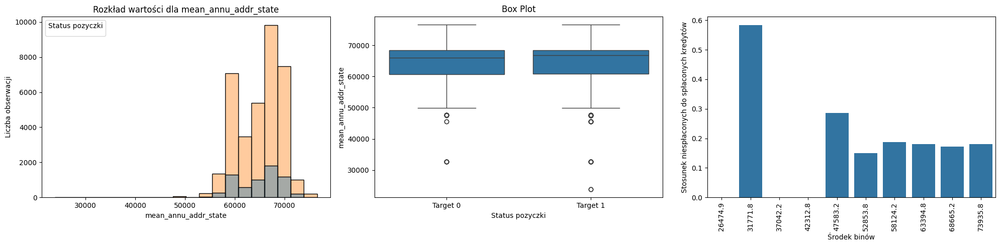

In [227]:
figure('mean_annu_addr_state', data, 10)

In [228]:
data['mean_annu_addr_state'].corr(data['loan_status'])


0.009717015122182883

In [229]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['mean_annu_addr_state']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,mean_annu_addr_state
mean_annu_addr_state,1.000000
mean_funded_addr_state,0.777558
mth_inc,0.132074
annual_inc_out,0.132074
annual_inc_trans,0.131121
annual_inc_log,0.131017


In [230]:
lista_new.append('mean_annu_addr_state')

*Nie widać zasadniczych różnic w rozkładzie zmiennej ami wpływu zmiennej na wartość 0_1_ratio*

#### <a name = '317'></a> 3.17 Zmienna "mean_fico_adrr"

Średni fico dla stanu

In [231]:
mean_addr = (data.groupby('addr_state')['fico_value'].mean()).astype(int)


In [232]:
mean_addr_dict = mean_addr.to_dict()
data['mean_fico_addr_state'] = data['addr_state'].map(mean_addr_dict)

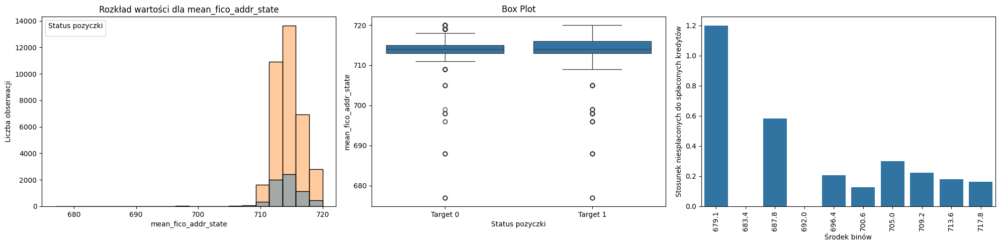

In [233]:
figure('mean_fico_addr_state', data, 10)

In [234]:
data['mean_fico_addr_state'].corr(data['loan_status'])

0.03048166250354077

In [235]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['mean_fico_addr_state']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,mean_fico_addr_state
mean_fico_addr_state,1.000000
mean_annu_addr_state,-0.279734


In [236]:
lista_new.append('mean_fico_addr_state')

*W zakresie występowania maksymalnej wartości danych widać nieznaczny spadek wartości 0_1_ratio ze wzrostem wartości zmiennej. Widoczne sa róznice w rozkładzie zmiennej - dla predykcji 0 zakres wartości i rozstęp interkwartylowy są mniejsze.*

#### <a name = '318'></a> 3.18 Zmienna "desc_len" długość opisu kredytu

In [237]:
data['desc_len'] = data['desc'].apply(lambda x: len(str(x).split()))

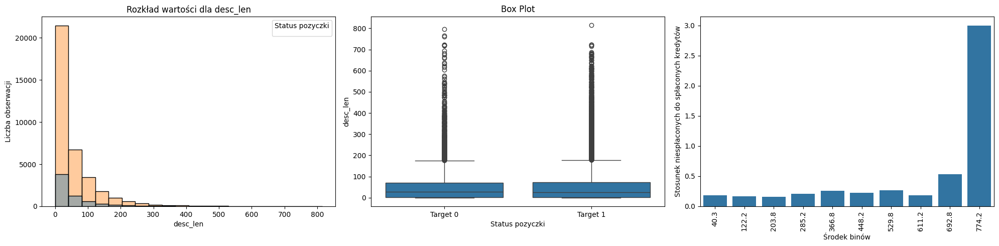

In [238]:
figure('desc_len', data, 10)

In [239]:
data[data['desc_len']>200].shape

(2004, 72)

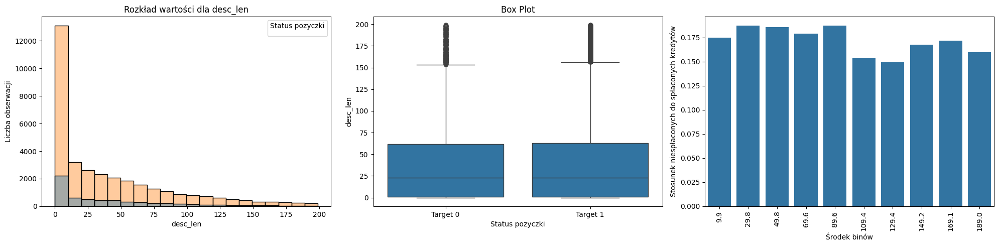

In [240]:
figure('desc_len', data[data['desc_len']<200], 10)

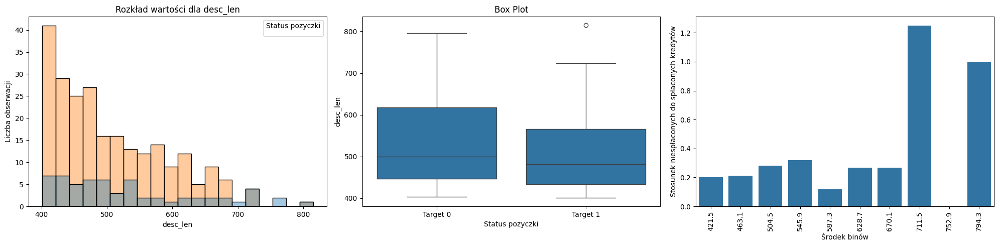

In [241]:
figure('desc_len', data[data['desc_len']>400], 10)

In [242]:
data['desc_len'].corr(data['loan_status'])

-0.010993115480110484

In [243]:
col_num = data.select_dtypes(include = 'number').columns.tolist()
corr = data[col_num].corr()['desc_len']
corr[(corr>0.1)|(corr<-0.1)].sort_values(ascending=False)

,desc_len
desc_len,1.000000
installment_trans,0.120650
loan_amnt_out,0.107329
installment,0.107150
loan_amnt,0.103033
funded_amnt_out,0.101151
funded_amnt_fico,0.100532
mth_install_to_incom,0.100206


In [244]:
lista_new.append('desc_len')

*Ze wzrostem długości opisu od wartości około 200 można zauważyć początkowo bardzo słabą, póżniej wyższą tendencję wzrostową wartości 0_1_ratio. Jednak jest to zakres z bardzo małą ilościa opbserwacji.*

#### <a name = '319'></a> 3.19 Zmienna 'consolidation'

 Określa czy pożyczka miała związek z konsolidacja kredytu

In [245]:
data['consolidation'] = data['title'].str.contains(r'\bconsol', case=False, na=False, regex=True)

In [246]:
data['consolidation'] = data['consolidation'].astype(int)

In [247]:
data['consolidation'].value_counts()

,count
consolidation,
0,34835
1,7696


In [248]:
data_0 = data[data['consolidation'] == 0]
data_1 = data[data['consolidation'] == 1]

In [249]:
paid_0 = data_0[data_0['loan_status'] == 0].count()/data_0[data_0['loan_status'] == 1].count()
paid_0['loan_status']

0.1785702202523937

In [250]:
paid_1 = data_1[data_1['loan_status'] == 0].count()/data_1[data_1['loan_status'] == 1].count()
paid_1['loan_status']

0.17621885985022162

In [251]:
lista_new.append('consolidation')

*Brak korelacji wystepowania słowa konsolidacja w opisie ze spłacalnością pożyczki*

#### <a name = '320'></a> 3.20 Zapisanie danych

In [252]:
data.to_csv('/content/drive/My Drive/Future_Collars/Loan_data_new_features.csv',  index = False)